In [2]:
#import libraries
import pandas as pd
import matplotlib.pyplot as plt
import math
import numpy as np
from scipy.optimize import minimize
from scipy.optimize import curve_fit
from sklearn.linear_model import LinearRegression
from sklearn import linear_model
from sklearn.metrics import r2_score
#from IPython.display import Image, display
import os
import seaborn as sns
import mglearn

In [3]:
print("Current Working Directory:", os.getcwd())


Current Working Directory: C:\Users\oluma\python folder for spec project


In [4]:
dq=pd.read_csv('platee.csv')
dq.columns
dl=dq[['plug_id', 'sw', 'pc', 'field_name','kl','porosity','cos_contact_angle']].dropna()

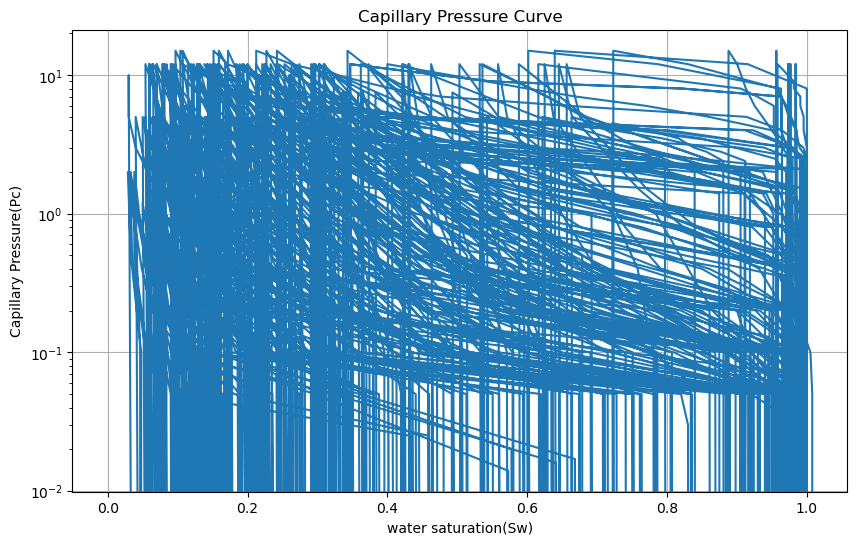

In [5]:
swdat=dl.sw
pcdat=dl.pc
plt.figure(figsize=(10,6))
plt.plot(swdat,pcdat)
#plt.plot(swdat,pcdat)
#plt.xlim(0,0)
plt.xlabel('water saturation(Sw)')
plt.ylabel('Capillary Pressure(Pc)')
plt.title('Capillary Pressure Curve')
plt.grid()
#plt.yscale('log')
plt.savefig('Firstcapillarycurve.png')
plt.show()

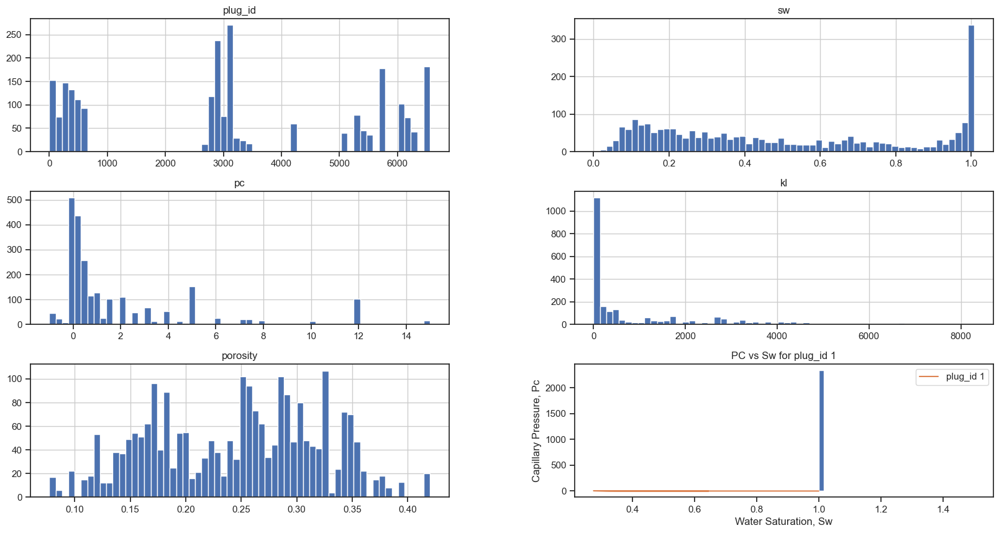

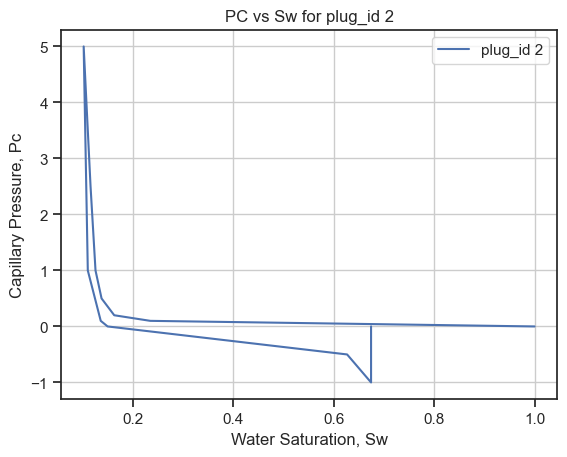

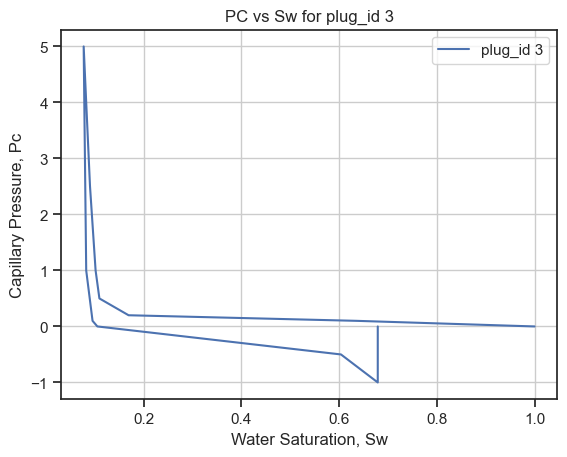

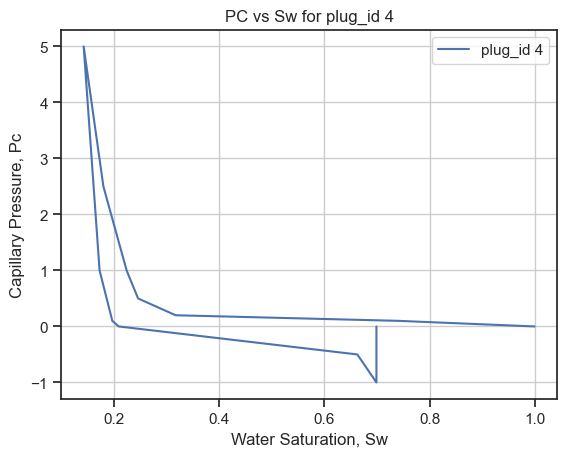

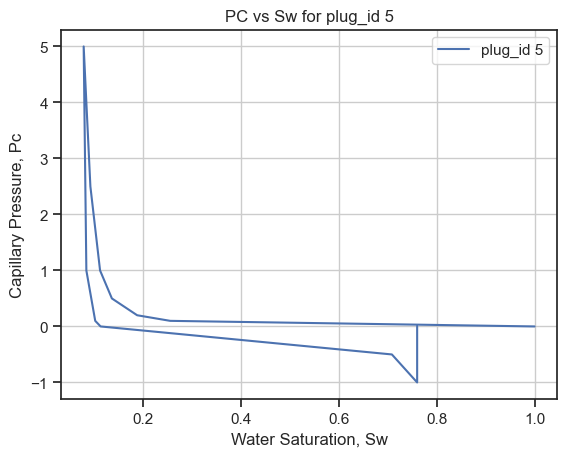

...

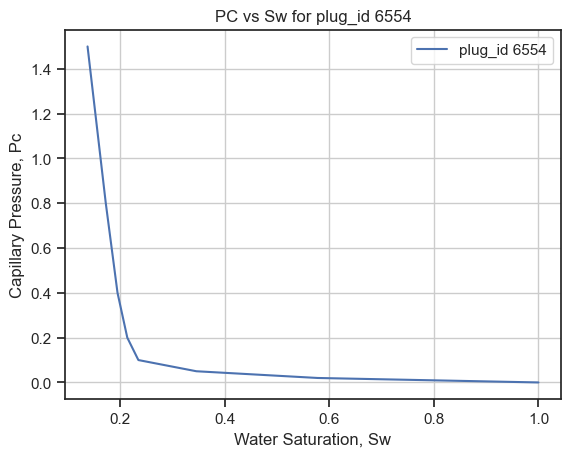

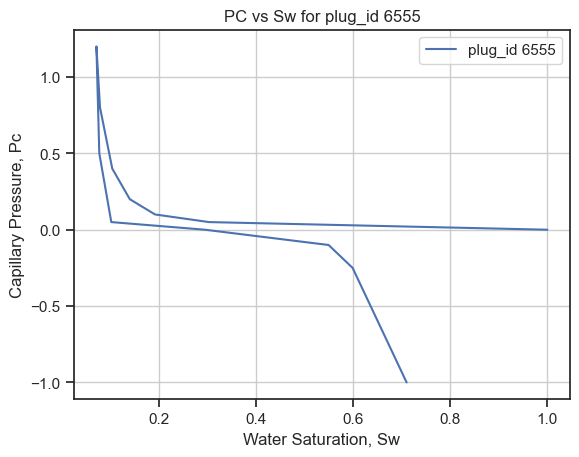

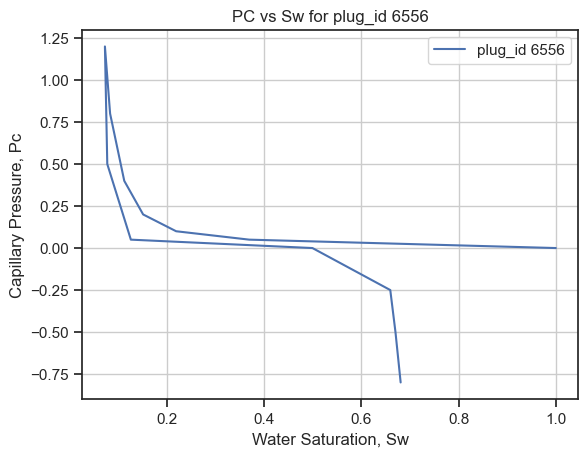

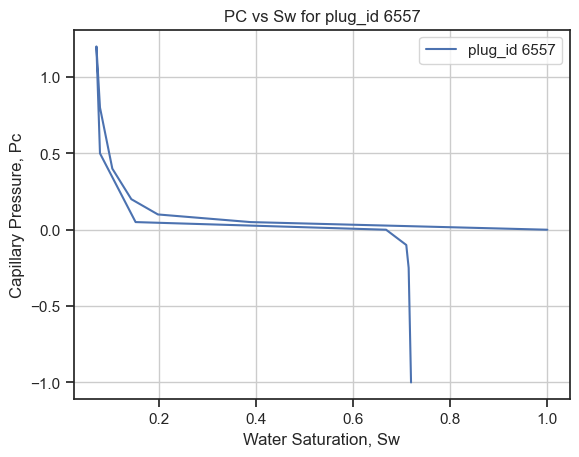

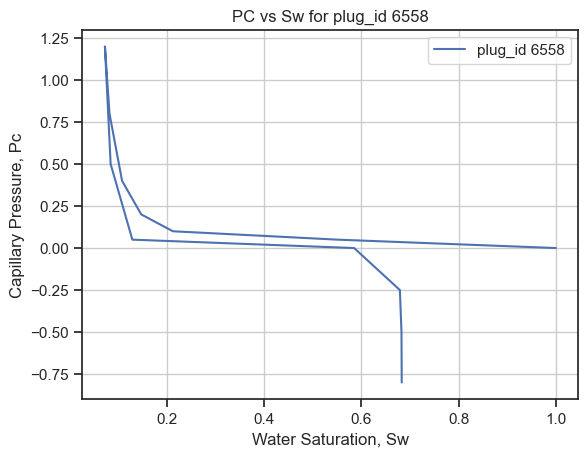

In [102]:
#visualize data using histogram
dl.hist(bins=60, figsize=(20,10))
# Get unique plug_id values
unique_plug_id1= dl['plug_id'].unique()

# Extract and plot PC and Sw for each unique expid
for plug_id in unique_plug_id1:
    subset1 = dl[dl['plug_id'] == plug_id]
#plot the whole PC curve from the dataset 
    pc_curve = subset1['pc']
    sw_curve = subset1['sw']
    
    plt.plot(sw_curve, pc_curve, label=f'plug_id {plug_id}')
    plt.xlabel('Water Saturation, Sw')
    plt.ylabel('Capillary Pressure, Pc')
    plt.title(f'PC vs Sw for plug_id {plug_id}')
    plt.legend()
    plt.grid()
    plt.savefig(f'plug_id_{plug_id}_curvesss.png')
    plt.show()

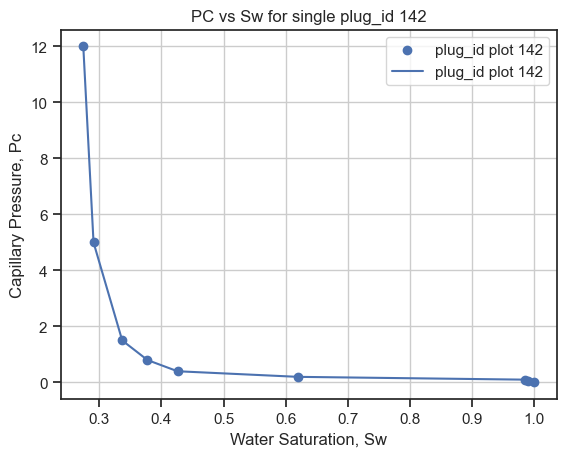

In [118]:
d_single=dl.query('plug_id in [142]')
unique_plug_id2=d_single[ 'plug_id'].unique()
for plug_id in unique_plug_id2:
    subset2 = d_single[d_single['plug_id'] == plug_id]
    pc_curve = subset2['pc']
    sw_curve = subset2['sw']
    plt.scatter(sw_curve, pc_curve, label=f'plug_id plot {plug_id}')
    plt.plot(sw_curve, pc_curve, label=f'plug_id plot {plug_id}')
    plt.xlabel('Water Saturation, Sw')
    plt.ylabel('Capillary Pressure, Pc'),
    plt.title(f'PC vs Sw for single plug_id {plug_id}')
    plt.legend()
    plt.grid()
    #plt.yscale('log')
    plt.savefig('afigureofpdbeforecp.png')
    plt.show()



Optimized c: 0.0010475429376251145
Optimized a: 3.9451483873949225
swirr 0.19900344153392102
       message: Optimization terminated successfully.
       success: True
        status: 0
           fun: 0.6474647757907664
             x: [ 1.048e-03  3.945e+00]
           nit: 178
          nfev: 328
 final_simplex: (array([[ 1.048e-03,  3.945e+00],
                       [ 1.047e-03,  3.945e+00],
                       [ 1.048e-03,  3.945e+00]]), array([ 6.475e-01,  6.475e-01,  6.475e-01]))


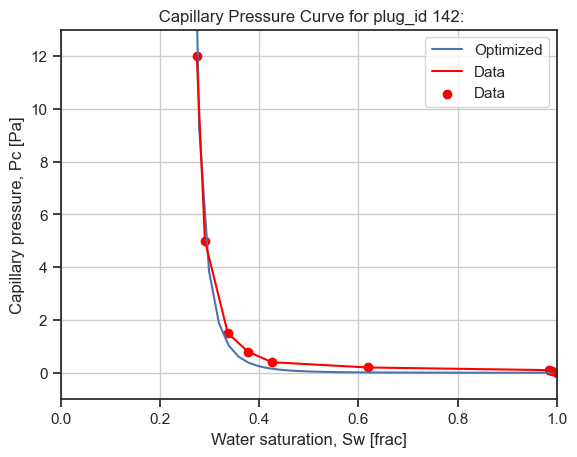

0.19900344153392102
0.274175824


In [120]:
     
#This is for one expid.
sw_data = d_single.sw
pc_data = d_single.pc
# Calculate an approximate swirr
swirr_threshold = np.min(sw_data)  #this threshold can be adjusted as needed but i changed it to min_sw
swirr = np.min(sw_data) * (1 - swirr_threshold)

# Define the SkjaevlandPD function
def skjaevlandPD(sw, swirr, c, a):
    return c / ((sw - swirr) / (1 - swirr)) ** a

# Define the objective function to minimize (least squares error)

def objective(params):
    c, a = params
    #normalized_sw = (sw_data - min(sw_data)) / (max(sw_data) - min(sw_data))  # Normalize sw data
    #normalized_pc_data = (pc_data - min(pc_data)) / (max(pc_data) - min(pc_data))  # Normalize pc data
    pc_pred = skjaevlandPD(sw_data, swirr, c, a)
    #L_regular= lambda_regular * (c**2 + a**2)
    lsw=np.sum((pc_pred - pc_data) ** 2)
    return lsw #+ L_regular
# Initial guess for parameters
initial_params = [1.0, 1.0]  # Starting values for c and a


# Perform optimization using Nelder-Mead method
result = minimize(objective, initial_params, method='Nelder-Mead')

# Extract optimized parameters
c_optimized, a_optimized = result.x

# Print optimized parameters
# Print optimized parameters
print("Optimized c:", c_optimized)  #threshold or entry pressure
print("Optimized a:", a_optimized)  #pore size distribution (curvature)
print("swirr", swirr)
print(result)

# Generate a plot of the optimized function
n_sw = np.arange(swirr, 1.0, 0.02)
pc_opt = skjaevlandPD(n_sw[1:], swirr, c_optimized, a_optimized)
plt.plot(n_sw[1:], pc_opt, label="Optimized")

plt.plot(sw_data, pc_data, color='red', label="Data")
plt.scatter(sw_data, pc_data, color='red', label="Data")
plt.ylim(min(pc_data) - 1, max(pc_data) + 1)
plt.xlim(0.0, 1.0)
plt.grid()
plt.xlabel('Water saturation, Sw [frac]')
plt.ylabel('Capillary pressure, Pc [Pa]')
plt.title(f" Capillary Pressure Curve for plug_id {plug_id}:")
plt.legend()
plt.savefig('afigureofpdaftercp2.png')
plt.show()
print(swirr)
b=min(sw_data)
print(b)

In [8]:
dq=pd.read_csv('platee.csv')
dp=dq[['plug_id', 'sw', 'pc','field_name','surface_tension','cos_contact_angle','porosity','kl']].dropna()
dp
#dp.query('plug_id in [206]')


,plug_id,sw,pc,field_name,surface_tension,cos_contact_angle,porosity,kl
0,1,1.000000,0.00,Oseberg Sør,30,1,0.184,16.7
1,1,0.919579,0.10,Oseberg Sør,30,1,0.184,16.7
2,1,0.451998,0.20,Oseberg Sør,30,1,0.184,16.7
3,1,0.369452,0.50,Oseberg Sør,30,1,0.184,16.7
4,1,0.341912,1.00,Oseberg Sør,30,1,0.184,16.7
...,...,...,...,...,...,...,...,...
2554,6558,0.128496,0.05,Grane,30,1,0.303,1710.0
2555,6558,0.584954,0.00,Grane,30,1,0.303,1710.0
2556,6558,0.679068,-0.25,Grane,30,1,0.303,1710.0
2557,6558,0.682362,-0.50,Grane,30,1,0.303,1710.0


In [9]:

# Define the SkjaevlandPD function
def skjaevlandPD(sw, swirr, c, a):
    return c / ((sw - swirr) / (1 - swirr))**a

# Load your data into a DataFrame

dp
# Find the minimum 'sw' for each 'expid' to set as 'swirr'
# Calculate an approximate swirr
sw_threshold=dp.groupby('plug_id')['sw'].min()  
swirr_threshold = dp.groupby('plug_id')['sw'].min()  
swirr_values = dp.groupby('plug_id')['sw'].min() * (1 - swirr_threshold)

# Regularization parameter (l2)
#l2_reg =0.01
#dp = dp.drop_duplicates(subset='expid', keep='first')
# Create a list to store the optimization results
optimization_results = []

accuracy = 0.90  # Adjust this value as needed

# Function to optimize 'c' and 'a' for a given 'expid'
def optimize_parameters(plug_id):
    subset = dp[dp['plug_id'] == plug_id]
    swirr = swirr_values.loc[plug_id]
    min_sw = sw_threshold.loc[plug_id] 

    # Define the optimization function to minimize.
    def objective(params):
        c, a = params
        predicted_pc = skjaevlandPD(subset['sw'],swirr, c, a)
        #Data fiiting and minimization using Least square error method
        lse=np.sum((predicted_pc - subset['pc'])**2)
        #regulularization
       #regularization=l2_reg * (c**2 + a**2)
        return lse

    # Initial guess for optimization parameters.
    initial_params = [1.0, 1.0]
    # Perform the Nelder-Mead optimization.
    result = minimize(objective, initial_params, method='nelder-mead')
    
     
    # Calculate predicted 'pc' using the model parameters
    predicted_pc = skjaevlandPD(subset['sw'], swirr_values[plug_id], c_optimized, a_optimized)
    
    # Calculate TSS and RSS
    tss = ((subset['pc'] - subset['pc'].mean()) ** 2).sum()
    rss = ((predicted_pc - subset['pc']) ** 2).sum()

    # Calculate R-squared
    r_sq = 1 - (rss / tss)
    
    # Calculate and store the value of the objective function (loss)
    loss = result.fun
    optimization_results.append(loss)
    print(f"Error value (lse) for plug_id {plug_id}: {loss}")
    return result.x, loss, r_sq


# Create a list to store the curves that meet the error criteria
filtered_curves = []

# Create DataFrames to store th*e filtered curves with specified features
curve_spps= pd.DataFrame(columns=['sw', 'pc', 'plug_id'])
curve_capls= pd.DataFrame(columns=['plug_id', 'a', 'c','min_sw'])
 
# Parameterize the curve for each 'expid' and plot the results and calculate R-squared for each plug_id
for plug_id in dp['plug_id'].unique():
    optimized_params, error_value, r_sq = optimize_parameters(plug_id)
    c_optimized, a_optimized = optimized_params
    swirr = swirr_values.loc[plug_id]
    min_sw = sw_threshold.loc[plug_id] 
    
    # Get the sw_threshold for this plug_id
    #kl_value = kl.loc[plug_id]  # Replace 'kl_values' with the actual source of KL values
    #porosity_value = porosity.loc[plug_id]  # Replace 'porosity_values' with the actual source of porosity values
     
     # Calculate the value of data_fitting_term + #regularization_term
    loss_value = optimization_results[-1]  # Get the last added value from the list
    
    
    if r_sq >= accuracy:
        #print the optimsed values 
        print(f"plug_id {plug_id}:")
        print(f"Optimized c: {c_optimized}")
        print(f"Optimized a: {a_optimized}")
        print(f"Swirr: {swirr}")
        print(f"Loss_value (lse ): {loss_value}")
        #print(f"porosity_ (porosity_value): {porosity_value}")
        #print(f"kl_ (kl_value): {kl_value}")
        print(f"Minimum Sw (min_sw): {min_sw}")
        print(f"R-squared: {r_sq}\n")
        
        
    # Generate the optimized Pc values based on the optimized parameters.
        n_sw = np.arange(swirr, 1.0, 0.02)
        pc_opt = skjaevlandPD(n_sw[1:], swirr, c_optimized, a_optimized)

    #Plot the original data and the optimized curve.
        plt.figure(figsize=(8, 6))
        #plt.scatter(dp[dp['plug_id'] == plug_id]['sw'], dp[dp['plug_id'] == plug_id]['pc'], label='Original Data', marker='o')
        plt.plot(n_sw[1:], pc_opt, label='Optimized Data', color='red')
        #plt.ylim(min(dp['pc']), max(dp['pc']) +1)
        #plt.xlim(0.0, 1.02)
        plt.grid()
        plt.xlabel('Water Saturation, Sw')
        plt.ylabel('Capillary Pressure, Pc')
        plt.title(f'Optimized PC vs Sw for plug_id {plug_id}')
        plt.legend()
        output_folder = 'C:\\Users\oluma\python folder for spec project\save python image'
        file_path = os.path.join(output_folder, f'plug_id_{plug_id}_scaled_curve.png,')
        plt.savefig(f'plug_id_{plug_id}_curve.png')
        
        #plt.show()
        plt.close()
        
        # Store 'sw', 'pc', 'plug_id', and 'swirr' in the first DataFrame
        subset = dp[dp['plug_id'] == plug_id]
        curve_spps = pd.concat([curve_spps, subset], ignore_index=True)

        # Store 'c', 'a', 'plug_id', and 'swirr' in the second DataFrame
        curve_capls= curve_capls.append({
            'c': c_optimized,
            'a': a_optimized,
            'n_sw': n_sw,
            'pc-opt':pc_opt,
            'plug_id': plug_id,
            'loss_value':loss_value,
            'swirr': swirr,
            'min_sw':min_sw,
            'R-squared': r_sq,
        }, ignore_index=True)
        
        
# Merge the two DataFrames into one
merged_curve_df = pd.merge(curve_spps, curve_capls, on='plug_id', how='inner')

# Print the merged DataFrame
print("Merged DataFrame:")
print(merged_curve_df)

# Save the merged DataFrame to a CSV file
merged_curve_df.to_csv('merged_curve_data.csv', index=False)

print("Saved merged DataFrame to CSV file.")       

# Print the DataFrames for the filtered curves
print("DataFrame for filtered curves with 'sw', 'pc', 'plug_id', and 'swirr':")
print(curve_spps)
print("\nDataFrame for filtered curves with 'c', 'a', 'kl', 'plug_id', and 'swirr':")
print(curve_capls)

# Save the DataFrames to CSV files
curve_spps.to_csv('curve_spps_no_lse.csv', index=False)
curve_capls.to_csv('curve_capls_no_lse.csv', index=False)

#print("Saved DataFrames to CSV files.")


Error value (lse) for plug_id 1: 4.414690980206796
Error value (lse) for plug_id 2: 3.9586460632250007
Error value (lse) for plug_id 3: 5.512695956167045
Error value (lse) for plug_id 4: 4.533805565545554
Error value (lse) for plug_id 5: 5.482924042746886
Error value (lse) for plug_id 6: 2.1964186809514774
Error value (lse) for plug_id 7: 8.408383364478043
Error value (lse) for plug_id 8: 2.900594030062367
Error value (lse) for plug_id 9: 4.061921362839537
Error value (lse) for plug_id 71: 0.17191711292356376
Error value (lse) for plug_id 72: 0.5204142078646734
Error value (lse) for plug_id 73: 0.4714550655516294
Error value (lse) for plug_id 83: 0.5662548319551116
Error value (lse) for plug_id 88: 0.636712250403425
Error value (lse) for plug_id 134: 2.1863900414866677
Error value (lse) for plug_id 140: 0.11457627653445995
Error value (lse) for plug_id 142: 0.6474647757907664
plug_id 142:
Optimized c: 0.0010475429376251145
Optimized a: 3.9451483873949225
Swirr: 0.19900344153392102
Loss

C:\Users\oluma\AppData\Local\Temp\ipykernel_17932\2813282787.py:123: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  curve_capls= curve_capls.append({


Error value (lse) for plug_id 144: 0.8265814359948422
Error value (lse) for plug_id 206: 16.050745892290365
Error value (lse) for plug_id 207: 0.012196774616998621
plug_id 207:
Optimized c: 0.04572430086948319
Optimized a: 0.8840692855627132
Swirr: 0.063376
Loss_value (lse ): 0.012196774616998621
Minimum Sw (min_sw): 0.068
R-squared: 0.9220738649877606



C:\Users\oluma\AppData\Local\Temp\ipykernel_17932\2813282787.py:123: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  curve_capls= curve_capls.append({


Error value (lse) for plug_id 208: 0.8314583652017217
Error value (lse) for plug_id 209: 0.009885694379561268
Error value (lse) for plug_id 210: 0.029731316430283667
plug_id 210:
Optimized c: 0.07949929270539693
Optimized a: 0.7799825423632398
Swirr: 0.063376
Loss_value (lse ): 0.029731316430283667
Minimum Sw (min_sw): 0.068
R-squared: 0.948133546833237



C:\Users\oluma\AppData\Local\Temp\ipykernel_17932\2813282787.py:123: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  curve_capls= curve_capls.append({


Error value (lse) for plug_id 232: 48.15060081323794
Error value (lse) for plug_id 233: 29.315160810807818
Error value (lse) for plug_id 234: 56.105248621550736
Error value (lse) for plug_id 235: 28.06023303014777
Error value (lse) for plug_id 236: 0.003145928571150932
Error value (lse) for plug_id 237: 0.0022120034820876993
Error value (lse) for plug_id 238: 0.0029284118254098647
Error value (lse) for plug_id 239: 2.629578935192881
Error value (lse) for plug_id 240: 0.0025806603665873653
Error value (lse) for plug_id 241: 0.0029435718083704924
Error value (lse) for plug_id 242: 63.63676489468835
Error value (lse) for plug_id 243: 20.829872545662695
Error value (lse) for plug_id 244: 35.06850442529344
Error value (lse) for plug_id 245: 35.83082066198948
Error value (lse) for plug_id 246: 35.83082066198948
Error value (lse) for plug_id 247: 9.854851648791481
Error value (lse) for plug_id 248: 11.931380273679284
plug_id 248:
Optimized c: 3.0277069427624896
Optimized a: 0.3559936323554372

C:\Users\oluma\AppData\Local\Temp\ipykernel_17932\2813282787.py:123: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  curve_capls= curve_capls.append({


Error value (lse) for plug_id 249: 9.447487782552836
Error value (lse) for plug_id 250: 11.136766337174823
plug_id 250:
Optimized c: 2.9244308607870138
Optimized a: 0.3780214988500752
Swirr: 0.09578367598487723
Loss_value (lse ): 11.136766337174823
Minimum Sw (min_sw): 0.107296137
R-squared: 0.9241484855091952



C:\Users\oluma\AppData\Local\Temp\ipykernel_17932\2813282787.py:123: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  curve_capls= curve_capls.append({


Error value (lse) for plug_id 251: 9.153532189064817
plug_id 251:
Optimized c: 2.7029336756212508
Optimized a: 0.3967261268392287
Swirr: 0.093028727206824
Loss_value (lse ): 9.153532189064817
Minimum Sw (min_sw): 0.103803997
R-squared: 0.9474145618085794



C:\Users\oluma\AppData\Local\Temp\ipykernel_17932\2813282787.py:123: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  curve_capls= curve_capls.append({


Error value (lse) for plug_id 252: 10.881347856141664
Error value (lse) for plug_id 253: 22.328488809175166
Error value (lse) for plug_id 333: 0.018243943747044272
Error value (lse) for plug_id 334: 0.28493863180783086
Error value (lse) for plug_id 357: 0.26301389241507844
Error value (lse) for plug_id 358: 0.5309885524387106
plug_id 358:
Optimized c: 0.31199537898161644
Optimized a: 1.2018576230607279
Swirr: 0.16000000000000003
Loss_value (lse ): 0.5309885524387106
Minimum Sw (min_sw): 0.2
R-squared: 0.9939578568506027



C:\Users\oluma\AppData\Local\Temp\ipykernel_17932\2813282787.py:123: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  curve_capls= curve_capls.append({


Error value (lse) for plug_id 359: 1.4357371708748574
Error value (lse) for plug_id 360: 0.7948544421362943
Error value (lse) for plug_id 361: 0.36019856803117295
plug_id 361:
Optimized c: 0.17226952123405403
Optimized a: 1.0705433268377873
Swirr: 0.1131
Loss_value (lse ): 0.36019856803117295
Minimum Sw (min_sw): 0.13
R-squared: 0.9767991745939034



C:\Users\oluma\AppData\Local\Temp\ipykernel_17932\2813282787.py:123: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  curve_capls= curve_capls.append({


Error value (lse) for plug_id 362: 0.40231854776489784
Error value (lse) for plug_id 363: 0.6159631232022724
Error value (lse) for plug_id 364: 0.6565424277507318
Error value (lse) for plug_id 365: 0.02438627450799642
Error value (lse) for plug_id 366: 0.2746928006509495
Error value (lse) for plug_id 367: 0.20118681322197277
Error value (lse) for plug_id 368: 0.7514917714826761
Error value (lse) for plug_id 369: 0.741374310065601
plug_id 369:
Optimized c: 0.2918235950712206
Optimized a: 0.7002593082322661
Swirr: 0.107116
Loss_value (lse ): 0.741374310065601
Minimum Sw (min_sw): 0.122
R-squared: 0.9452012851587135



C:\Users\oluma\AppData\Local\Temp\ipykernel_17932\2813282787.py:123: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  curve_capls= curve_capls.append({


Error value (lse) for plug_id 370: 0.7358051992186251
Error value (lse) for plug_id 371: 0.16613149673890662
Error value (lse) for plug_id 466: 0.07711913916056766
Error value (lse) for plug_id 467: 2.731691462983694
Error value (lse) for plug_id 470: 0.058323671032569406
Error value (lse) for plug_id 471: 3.6288688129397344
Error value (lse) for plug_id 474: 1.60001812237388
Error value (lse) for plug_id 476: 0.04568537955064075
Error value (lse) for plug_id 477: 0.012782257289583161
Error value (lse) for plug_id 480: 0.026255594305563967
Error value (lse) for plug_id 481: 6.764549353029472
Error value (lse) for plug_id 482: 2.0713149966501616
Error value (lse) for plug_id 580: 0.3673363891202964
Error value (lse) for plug_id 583: 0.8143278102314457
Error value (lse) for plug_id 593: 2.477258193125448
Error value (lse) for plug_id 594: 4.158938266722826
Error value (lse) for plug_id 595: 4.377204397798804
Error value (lse) for plug_id 596: 2.6152632616445888
Error value (lse) for plug

C:\Users\oluma\AppData\Local\Temp\ipykernel_17932\2813282787.py:123: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  curve_capls= curve_capls.append({


Error value (lse) for plug_id 2741: 2.6003998316260555
Error value (lse) for plug_id 2742: 1.9605108718849755
Error value (lse) for plug_id 2743: 2.4519567548829615
Error value (lse) for plug_id 2757: 3.245930543745334
Error value (lse) for plug_id 2761: 3.9056746305913443
Error value (lse) for plug_id 2767: 4.675959925869198
Error value (lse) for plug_id 2872: 6.4725
Error value (lse) for plug_id 2874: 6.4725
Error value (lse) for plug_id 2875: 6.552398488951009
Error value (lse) for plug_id 2876: 6.349430255768682
Error value (lse) for plug_id 2877: 6.4477292129790165
Error value (lse) for plug_id 2878: 6.283183483923289
Error value (lse) for plug_id 2884: 6.4721869048321015
Error value (lse) for plug_id 2885: 1.5462472935429932
Error value (lse) for plug_id 2886: 6.4725
Error value (lse) for plug_id 2887: 2.431191948481075
Error value (lse) for plug_id 2888: 6.32460085491429
Error value (lse) for plug_id 2889: 6.472367204522243
Error value (lse) for plug_id 2890: 6.26288324540565
Er

C:\Users\oluma\AppData\Local\Temp\ipykernel_17932\2813282787.py:123: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  curve_capls= curve_capls.append({


Error value (lse) for plug_id 3016: 0.7891522735346373
Error value (lse) for plug_id 3017: 0.3961248552102363
Error value (lse) for plug_id 3018: 2.086048696680342
Error value (lse) for plug_id 3019: 2.382085524761592
Error value (lse) for plug_id 3020: 2.579336252757265
Error value (lse) for plug_id 3021: 1.7010182498425603
Error value (lse) for plug_id 3022: 3.3212970529365164
Error value (lse) for plug_id 3023: 1.1245246551369108
plug_id 3023:
Optimized c: 0.2931529709743672
Optimized a: 0.990651561082788
Swirr: 0.122551
Loss_value (lse ): 1.1245246551369108
Minimum Sw (min_sw): 0.143
R-squared: 0.960702840313889



C:\Users\oluma\AppData\Local\Temp\ipykernel_17932\2813282787.py:123: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  curve_capls= curve_capls.append({


Error value (lse) for plug_id 3078: 1.801961548472978
Error value (lse) for plug_id 3079: 3.251159682632562
Error value (lse) for plug_id 3080: 2.4206957500342914
Error value (lse) for plug_id 3081: 1.2938166014500385
Error value (lse) for plug_id 3082: 0.6973086993740145
Error value (lse) for plug_id 3083: 0.6977315664673834
Error value (lse) for plug_id 3084: 0.7940232335777553
plug_id 3084:
Optimized c: 0.33031921784847296
Optimized a: 1.6603341587431115
Swirr: 0.21079599999999998
Loss_value (lse ): 0.7940232335777553
Minimum Sw (min_sw): 0.302
R-squared: 0.9760996964855315



C:\Users\oluma\AppData\Local\Temp\ipykernel_17932\2813282787.py:123: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  curve_capls= curve_capls.append({


Error value (lse) for plug_id 3085: 0.34174154141106095
Error value (lse) for plug_id 3086: 1.1833464632476187
Error value (lse) for plug_id 3087: 3.9479654746351946
Error value (lse) for plug_id 3088: 1.2328200855333498
Error value (lse) for plug_id 3089: 0.40458410217620533
Error value (lse) for plug_id 3090: 5.1973171586068965
Error value (lse) for plug_id 3091: 5.828794928640791
Error value (lse) for plug_id 3092: 3.192170672369601
Error value (lse) for plug_id 3093: 2.961735004532153
Error value (lse) for plug_id 3094: 0.8298183188019578
plug_id 3094:
Optimized c: 0.3819451938083043
Optimized a: 1.0120711040088564
Swirr: 0.139776
Loss_value (lse ): 0.8298183188019578
Minimum Sw (min_sw): 0.168
R-squared: 0.9680473143497575



C:\Users\oluma\AppData\Local\Temp\ipykernel_17932\2813282787.py:123: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  curve_capls= curve_capls.append({


Error value (lse) for plug_id 3095: 5.856765858850129
Error value (lse) for plug_id 3150: 4.6844501434129615
Error value (lse) for plug_id 3151: 1.7008077136326818
Error value (lse) for plug_id 3152: 5.550635435262717
Error value (lse) for plug_id 3153: 1.7889947961722827
Error value (lse) for plug_id 3154: 1.126104593977654
plug_id 3154:
Optimized c: 0.4968452043837597
Optimized a: 1.0115980937437126
Swirr: 0.142416
Loss_value (lse ): 1.126104593977654
Minimum Sw (min_sw): 0.172
R-squared: 0.9736420265548069



C:\Users\oluma\AppData\Local\Temp\ipykernel_17932\2813282787.py:123: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  curve_capls= curve_capls.append({


Error value (lse) for plug_id 3155: 0.9322941062616789
Error value (lse) for plug_id 3156: 1.877339070864716
Error value (lse) for plug_id 3157: 2.9495175696665834
Error value (lse) for plug_id 3158: 0.8550298091535835
plug_id 3158:
Optimized c: 0.5181223988793082
Optimized a: 1.2781485035161535
Swirr: 0.21351900000000001
Loss_value (lse ): 0.8550298091535835
Minimum Sw (min_sw): 0.309
R-squared: 0.9136968913101814



C:\Users\oluma\AppData\Local\Temp\ipykernel_17932\2813282787.py:123: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  curve_capls= curve_capls.append({


Error value (lse) for plug_id 3159: 0.9070560632774822
Error value (lse) for plug_id 3160: 0.2714174265468534
Error value (lse) for plug_id 3161: 2.4252012671091157
Error value (lse) for plug_id 3162: 1.8457198731155193
Error value (lse) for plug_id 3163: 0.3646548574085544
Error value (lse) for plug_id 3164: 0.2284339294006381
Error value (lse) for plug_id 3165: 0.34263154447654876
Error value (lse) for plug_id 3167: 0.2322086979599891
Error value (lse) for plug_id 3168: 2.6190788023123357
Error value (lse) for plug_id 3169: 1.6670354845705397
Error value (lse) for plug_id 3170: 0.07506041066397406
Error value (lse) for plug_id 3252: 2.167366561428085
Error value (lse) for plug_id 3253: 1.5676654267688344
Error value (lse) for plug_id 3254: 1.9795621423779735
Error value (lse) for plug_id 3257: 1.255970260035792
Error value (lse) for plug_id 3258: 1.5404832030690667
Error value (lse) for plug_id 3363: 3.5931118441207213
Error value (lse) for plug_id 3364: 2.469142899982676
Error value

C:\Users\oluma\AppData\Local\Temp\ipykernel_17932\2813282787.py:123: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  curve_capls= curve_capls.append({


Error value (lse) for plug_id 4236: 3.094187326334663
Error value (lse) for plug_id 4237: 1.5992118636342953
Error value (lse) for plug_id 4238: 4.718721369104317
Error value (lse) for plug_id 4239: 0.45043903052276374
Error value (lse) for plug_id 4240: 1.5591330891951585
Error value (lse) for plug_id 4241: 5.24063720977318
Error value (lse) for plug_id 5040: 1.2949056653429865


C:\Users\oluma\anaconda3\lib\site-packages\scipy\optimize\_optimize.py:863: RuntimeWarning: invalid value encountered in subtract
  np.max(np.abs(fsim[0] - fsim[1:])) <= fatol):


Error value (lse) for plug_id 5043: inf
Error value (lse) for plug_id 5044: 1.6827724375272815
Error value (lse) for plug_id 5050: 1.6574879708500845
plug_id 5050:
Optimized c: 0.29402730787290743
Optimized a: 0.6684636163755404
Swirr: 0.05639999999999999
Loss_value (lse ): 1.6574879708500845
Minimum Sw (min_sw): 0.06
R-squared: 0.9838343079186219



C:\Users\oluma\AppData\Local\Temp\ipykernel_17932\2813282787.py:123: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  curve_capls= curve_capls.append({


Error value (lse) for plug_id 5054: 3.219355953633733
plug_id 5054:
Optimized c: 0.5189448816619634
Optimized a: 0.5456979666939888
Swirr: 0.051084
Loss_value (lse ): 3.219355953633733
Minimum Sw (min_sw): 0.054
R-squared: 0.9348316040203517



C:\Users\oluma\AppData\Local\Temp\ipykernel_17932\2813282787.py:123: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  curve_capls= curve_capls.append({


Error value (lse) for plug_id 5290: 0.42306355628963155
Error value (lse) for plug_id 5291: 2.751831671191235
Error value (lse) for plug_id 5295: 0.1268608236161582
Error value (lse) for plug_id 5297: 0.09745019064436079
Error value (lse) for plug_id 5298: 0.26733569229976173
Error value (lse) for plug_id 5301: 0.42019013872311683
plug_id 5301:
Optimized c: 0.21327619924389185
Optimized a: 1.3832657784983726
Swirr: 0.167056
Loss_value (lse ): 0.42019013872311683
Minimum Sw (min_sw): 0.212
R-squared: 0.9057266079452915



C:\Users\oluma\AppData\Local\Temp\ipykernel_17932\2813282787.py:123: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  curve_capls= curve_capls.append({


Error value (lse) for plug_id 5322: 1.5999315080826404
Error value (lse) for plug_id 5324: 1.1797406916926954
Error value (lse) for plug_id 5450: 0.34288188838494055
Error value (lse) for plug_id 5453: 0.28369896142499723
Error value (lse) for plug_id 5455: 0.3244329686211804
Error value (lse) for plug_id 5463: 1.0977298866652536
Error value (lse) for plug_id 5465: 12.060542777425372
Error value (lse) for plug_id 5466: 3.648562708644783
Error value (lse) for plug_id 5468: 4.454182126669305
Error value (lse) for plug_id 5470: 2.7613404386744174
Error value (lse) for plug_id 5471: 2.823911770846937
Error value (lse) for plug_id 5718: 0.08738503117413939
Error value (lse) for plug_id 5723: 4.604692135925231
Error value (lse) for plug_id 5730: 0.7561230477487029
Error value (lse) for plug_id 5736: 0.04881066244469691
Error value (lse) for plug_id 5737: 0.2415562868703488
Error value (lse) for plug_id 5742: 0.2501386269536397
Error value (lse) for plug_id 5743: 0.5171108388460879
Error valu

C:\Users\oluma\AppData\Local\Temp\ipykernel_17932\2813282787.py:123: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  curve_capls= curve_capls.append({


Error value (lse) for plug_id 5754: 3.4888782252814394
Error value (lse) for plug_id 5758: 0.8776807487231038
Error value (lse) for plug_id 5761: 0.006948563756147817
Error value (lse) for plug_id 5771: 0.021921182976740047
plug_id 5771:
Optimized c: 0.03485647502268077
Optimized a: 1.3786520241401221
Swirr: 0.13012127837950552
Loss_value (lse ): 0.021921182976740047
Minimum Sw (min_sw): 0.153764933
R-squared: 0.972048340057114



C:\Users\oluma\AppData\Local\Temp\ipykernel_17932\2813282787.py:123: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  curve_capls= curve_capls.append({


Error value (lse) for plug_id 5780: 0.8158623397919957
plug_id 5780:
Optimized c: 0.1133148994008481
Optimized a: 1.071447384309971
Swirr: 0.1330872875364999
Loss_value (lse ): 0.8158623397919957
Minimum Sw (min_sw): 0.15807499
R-squared: 0.9049767998248021



C:\Users\oluma\AppData\Local\Temp\ipykernel_17932\2813282787.py:123: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  curve_capls= curve_capls.append({


Error value (lse) for plug_id 5789: 0.626267487748754
Error value (lse) for plug_id 5790: 2.048522046815975
Error value (lse) for plug_id 5791: 0.16912976268223148
Error value (lse) for plug_id 5792: 2.9067076250981807
Error value (lse) for plug_id 6059: 152.18678255419638
Error value (lse) for plug_id 6060: 2.4031793610520302
plug_id 6060:
Optimized c: 0.2341373331741513
Optimized a: 0.7109336376986353
Swirr: 0.05639999999999999
Loss_value (lse ): 2.4031793610520302
Minimum Sw (min_sw): 0.06
R-squared: 0.9677691575299194



C:\Users\oluma\AppData\Local\Temp\ipykernel_17932\2813282787.py:123: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  curve_capls= curve_capls.append({


Error value (lse) for plug_id 6061: 5.15696163985554
Error value (lse) for plug_id 6062: 113.69609276584762
Error value (lse) for plug_id 6063: 4.3747881972887095
plug_id 6063:
Optimized c: 0.33091419345320605
Optimized a: 0.727236153678285
Swirr: 0.0736
Loss_value (lse ): 4.3747881972887095
Minimum Sw (min_sw): 0.08
R-squared: 0.9647470839648652



C:\Users\oluma\AppData\Local\Temp\ipykernel_17932\2813282787.py:123: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  curve_capls= curve_capls.append({


Error value (lse) for plug_id 6072: 8.448200852611262
Error value (lse) for plug_id 6156: 0.3534150589791403
Error value (lse) for plug_id 6157: 0.686711381478877
plug_id 6157:
Optimized c: 0.14774321873319274
Optimized a: 1.7056300351461082
Swirr: 0.19240000000000002
Loss_value (lse ): 0.686711381478877
Minimum Sw (min_sw): 0.26
R-squared: 0.9473931182165072



C:\Users\oluma\AppData\Local\Temp\ipykernel_17932\2813282787.py:123: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  curve_capls= curve_capls.append({


Error value (lse) for plug_id 6159: 0.14095763637285985
Error value (lse) for plug_id 6164: 0.49333289975067973
Error value (lse) for plug_id 6166: 1.4901126645373928
Error value (lse) for plug_id 6173: 2.967666852655981
Error value (lse) for plug_id 6179: 2.1364442511072186
Error value (lse) for plug_id 6192: 13.624167943510344
Error value (lse) for plug_id 6320: 0.5409098039615018
Error value (lse) for plug_id 6321: 0.2432875541260104
plug_id 6321:
Optimized c: 0.10521711606128839
Optimized a: 0.8110623788583162
Swirr: 0.09000000000000001
Loss_value (lse ): 0.2432875541260104
Minimum Sw (min_sw): 0.1
R-squared: 0.9526798766568128



C:\Users\oluma\AppData\Local\Temp\ipykernel_17932\2813282787.py:123: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  curve_capls= curve_capls.append({


Error value (lse) for plug_id 6322: 0.44264110450949146
Error value (lse) for plug_id 6323: 0.24357576897860567
Error value (lse) for plug_id 6324: 0.369266031413908
plug_id 6324:
Optimized c: 0.1716128478133488
Optimized a: 0.7030875175949001
Swirr: 0.09000000000000001
Loss_value (lse ): 0.369266031413908
Minimum Sw (min_sw): 0.1
R-squared: 0.9371101924995238



C:\Users\oluma\AppData\Local\Temp\ipykernel_17932\2813282787.py:123: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  curve_capls= curve_capls.append({


Error value (lse) for plug_id 6325: 0.43961842041812105
plug_id 6325:
Optimized c: 0.159472749529253
Optimized a: 0.7194290578123577
Swirr: 0.09000000000000001
Loss_value (lse ): 0.43961842041812105
Minimum Sw (min_sw): 0.1
R-squared: 0.9659382793410735



C:\Users\oluma\AppData\Local\Temp\ipykernel_17932\2813282787.py:123: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  curve_capls= curve_capls.append({


Error value (lse) for plug_id 6502: 0.15860076135916698
Error value (lse) for plug_id 6503: 0.017576813950020545
Error value (lse) for plug_id 6504: 0.005029081135594583
plug_id 6504:
Optimized c: 0.01657221787339773
Optimized a: 1.1633338448902513
Swirr: 0.0979
Loss_value (lse ): 0.005029081135594583
Minimum Sw (min_sw): 0.11
R-squared: 0.9037660513373065



C:\Users\oluma\AppData\Local\Temp\ipykernel_17932\2813282787.py:123: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  curve_capls= curve_capls.append({


Error value (lse) for plug_id 6541: 3.309921720978
Error value (lse) for plug_id 6542: 0.26074650658008175
Error value (lse) for plug_id 6544: 0.06680938468900563
Error value (lse) for plug_id 6546: 0.05862480619948049
Error value (lse) for plug_id 6547: 3.120775951082996
Error value (lse) for plug_id 6549: 0.0017570321761186183
Error value (lse) for plug_id 6550: 0.43481855717364054
Error value (lse) for plug_id 6551: 3.11324750644455
Error value (lse) for plug_id 6552: 3.3112905849108025
Error value (lse) for plug_id 6554: 0.11221810981457178
Error value (lse) for plug_id 6555: 3.317532338798979
Error value (lse) for plug_id 6556: 3.170087683446037
Error value (lse) for plug_id 6557: 3.365062187897745
Error value (lse) for plug_id 6558: 3.200304761423263
Merged DataFrame:
           sw    pc plug_id field_name  surface_tension  cos_contact_angle  \
0    1.000000  0.00     142       Siri             30.0                1.0   
1    0.989560  0.05     142       Siri             30.0    

In [10]:
dc_spps=pd.read_csv('curve_spps_no_lse.csv')
dc_capls=pd.read_csv('curve_capls_no_lse.csv')
dc_merge=pd.read_csv('merged_curve_data.csv')
#dc[j_function]= 
#dc_spps.tail(5)
dc_merge
#dc_capls

,sw,pc,plug_id,field_name,surface_tension,cos_contact_angle,porosity,kl,a,c,min_sw,n_sw,pc-opt,loss_value,swirr,R-squared
0,1.000000,0.00,142,Siri,30.0,1.0,0.355,567.0,3.945148,0.001048,0.274176,[0.19900344 0.21900344 0.23900344 0.25900344 0...,[2.20124925e+03 1.42909539e+02 2.88639040e+01 ...,0.647465,0.199003,0.966911
1,0.989560,0.05,142,Siri,30.0,1.0,0.355,567.0,3.945148,0.001048,0.274176,[0.19900344 0.21900344 0.23900344 0.25900344 0...,[2.20124925e+03 1.42909539e+02 2.88639040e+01 ...,0.647465,0.199003,0.966911
2,0.984615,0.10,142,Siri,30.0,1.0,0.355,567.0,3.945148,0.001048,0.274176,[0.19900344 0.21900344 0.23900344 0.25900344 0...,[2.20124925e+03 1.42909539e+02 2.88639040e+01 ...,0.647465,0.199003,0.966911
3,0.619780,0.20,142,Siri,30.0,1.0,0.355,567.0,3.945148,0.001048,0.274176,[0.19900344 0.21900344 0.23900344 0.25900344 0...,[2.20124925e+03 1.42909539e+02 2.88639040e+01 ...,0.647465,0.199003,0.966911
4,0.425824,0.40,142,Siri,30.0,1.0,0.355,567.0,3.945148,0.001048,0.274176,[0.19900344 0.21900344 0.23900344 0.25900344 0...,[2.20124925e+03 1.42909539e+02 2.88639040e+01 ...,0.647465,0.199003,0.966911
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
231,0.910000,0.05,6504,Volve,30.0,1.0,0.264,340.0,1.163334,0.016572,0.110000,[0.0979 0.1179 0.1379 0.1579 0.1779 0.1979 0.2...,[1.39250319 0.62172427 0.38792243 0.2775872 0...,0.005029,0.097900,0.903766
232,0.520000,0.10,6504,Volve,30.0,1.0,0.264,340.0,1.163334,0.016572,0.110000,[0.0979 0.1179 0.1379 0.1579 0.1779 0.1979 0.2...,[1.39250319 0.62172427 0.38792243 0.2775872 0...,0.005029,0.097900,0.903766
233,0.170000,0.30,6504,Volve,30.0,1.0,0.264,340.0,1.163334,0.016572,0.110000,[0.0979 0.1179 0.1379 0.1579 0.1779 0.1979 0.2...,[1.39250319 0.62172427 0.38792243 0.2775872 0...,0.005029,0.097900,0.903766
234,0.130000,0.80,6504,Volve,30.0,1.0,0.264,340.0,1.163334,0.016572,0.110000,[0.0979 0.1179 0.1379 0.1579 0.1779 0.1979 0.2...,[1.39250319 0.62172427 0.38792243 0.2775872 0...,0.005029,0.097900,0.903766


In [ ]:
dc_merge

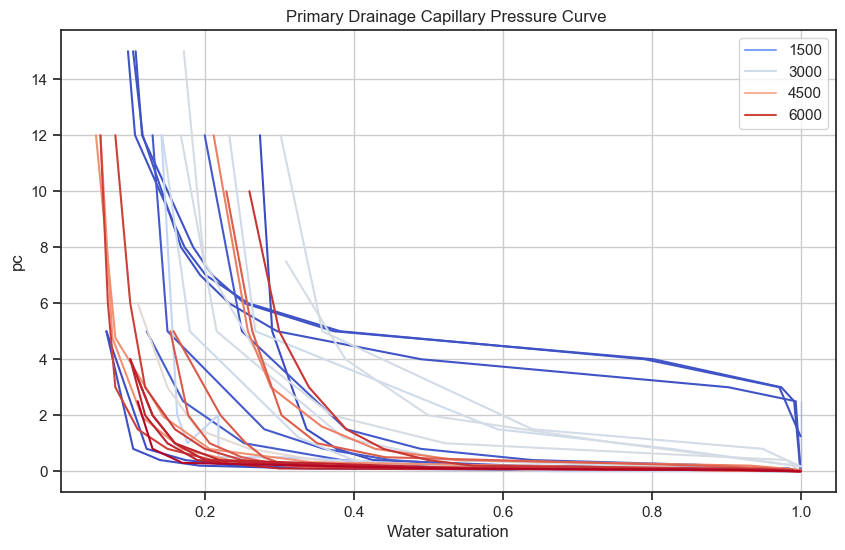

In [83]:
plt.figure(figsize=(10,6))
#ranking=["g1", "g2", "g3", "g4"]
sns.set_theme(style="ticks")
#sns.lmplot(dc_merge, x="Norm_porosity", y="RQI" , lowess=True, line_kws={"color": "C1"})
sns.lineplot(dc_merge, y="pc", x="sw" ,hue='plug_id', palette="coolwarm" ,markers=True)
plt.xlabel('Water saturation')
plt.ylabel('pc')
plt.title('Primary Drainage Capillary Pressure Curve ')
#plt.ylim(0.01,10)
#plt.xlim(0.1,1)
plt.legend()
plt.grid()
plt.savefig('newpc curve.png')
#plt.yscale('log')
#plt.xscale('log')
plt.show()

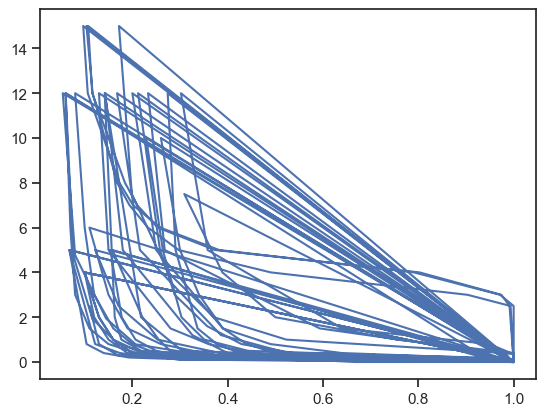

In [16]:
plt.plot(dc_merge.sw, dc_merge.pc, )
#sns.lineplot(dc_merge, x='sw', y='pc')
plt.show()

In [19]:

dc_capls

,plug_id,a,c,min_sw,n_sw,pc-opt,loss_value,swirr,R-squared
0,142,3.945148,0.001048,0.274176,[0.19900344 0.21900344 0.23900344 0.25900344 0...,[2.20124925e+03 1.42909539e+02 2.88639040e+01 ...,0.647465,0.199003,0.966911
1,207,0.884069,0.045724,0.068000,[0.063376 0.083376 0.103376 0.123376 0.143376 ...,[1.37093231 0.74282179 0.51904829 0.4024883 0...,0.012197,0.063376,0.922074
2,210,0.779983,0.079499,0.068000,[0.063376 0.083376 0.103376 0.123376 0.143376 ...,[1.59717177 0.93015106 0.67796204 0.54169564 0...,0.029731,0.063376,0.948134
3,248,0.355994,3.027707,0.096958,[0.08755729 0.10755729 0.12755729 0.14755729 0...,[11.79695137 9.21732769 7.97843407 7.201786...,11.931380,0.087557,0.902172
4,250,0.378021,2.924431,0.107296,[0.09578368 0.11578368 0.13578368 0.15578368 0...,[12.35260492 9.50523243 8.15448352 7.314201...,11.136766,0.095784,0.924148
5,251,0.396726,2.702934,0.103804,[0.09302873 0.11302873 0.13302873 0.15302873 0...,[12.27545008 9.32418669 7.93872864 7.082465...,9.153532,0.093029,0.947415
6,358,1.201858,0.311995,0.200000,[0.16 0.18 0.2 0.22 0.24 0.26 0.28 0.3 0.32 ...,[27.86523407 12.11344022 7.4409927 5.265896...,0.530989,0.160000,0.993958
7,361,1.070543,0.172270,0.130000,[0.1131 0.1331 0.1531 0.1731 0.1931 0.2131 0.2...,[9.98221701 4.7529293 3.07927185 2.26305808 1...,0.360199,0.113100,0.976799
8,369,0.700259,0.291824,0.122000,[0.107116 0.127116 0.147116 0.167116 0.187116 ...,[4.17237882 2.56793884 1.93319264 1.58046768 1...,0.741374,0.107116,0.945201
9,2740,2.222619,0.002714,0.141966,[0.12181196 0.14181196 0.16181196 0.18181196 0...,[1.21469754e+01 2.60251507e+00 1.05684070e+00 ...,3.112864,0.121812,0.933034


In [24]:
dc_merge['scaled_sw']=(dc_merge['sw']- dc_merge['swirr'])/(1-dc_merge['swirr'])
dc_merge['RQI']=0.0314*(np.sqrt((dc_merge['kl'])/dc_merge['porosity']))
dc_merge['J_function']= (dc_merge['pc'])/(dc_merge['surface_tension']*dc_merge['cos_contact_angle'])* (np.sqrt((dc_merge['kl'])/dc_merge['porosity']))
dc_merge['Norm_porosity']=(dc_merge['porosity'])/(1-dc_merge['porosity'])
dc_merge['FZI']= dc_merge['RQI']/dc_merge['Norm_porosity']
dc_merge['Radius']= 2*(dc_merge['surface_tension'])*dc_merge['cos_contact_angle']/(dc_merge['pc'])
print("Dataframe with scaled 'sw':")
print("Dataframe with rock_q 'RQI':")
print("Dataframe with j_f 'J_function':")
print(dc_merge)
dc_merge.to_csv('n_scaled_sw.csv', index=False)
print("Dataframe with scaled 'sw' to a CSV file")
a=pd.read_csv('n_scaled_sw.csv')
a


Dataframe with scaled 'sw':
Dataframe with rock_q 'RQI':
Dataframe with j_f 'J_function':
           sw    pc  plug_id field_name  surface_tension  cos_contact_angle  \
0    1.000000  0.00      142       Siri             30.0                1.0   
1    0.989560  0.05      142       Siri             30.0                1.0   
2    0.984615  0.10      142       Siri             30.0                1.0   
3    0.619780  0.20      142       Siri             30.0                1.0   
4    0.425824  0.40      142       Siri             30.0                1.0   
..        ...   ...      ...        ...              ...                ...   
231  0.910000  0.05     6504      Volve             30.0                1.0   
232  0.520000  0.10     6504      Volve             30.0                1.0   
233  0.170000  0.30     6504      Volve             30.0                1.0   
234  0.130000  0.80     6504      Volve             30.0                1.0   
235  0.110000  2.50     6504      Volve  

,sw,pc,plug_id,field_name,surface_tension,cos_contact_angle,porosity,kl,a,c,...,pc-opt,loss_value,swirr,R-squared,scaled_sw,RQI,J_function,Norm_porosity,FZI,Radius
0,1.000000,0.00,142,Siri,30.0,1.0,0.355,567.0,3.945148,0.001048,...,[2.20124925e+03 1.42909539e+02 2.88639040e+01 ...,0.647465,0.199003,0.966911,1.000000,1.254894,0.000000,0.550388,2.280018,inf
1,0.989560,0.05,142,Siri,30.0,1.0,0.355,567.0,3.945148,0.001048,...,[2.20124925e+03 1.42909539e+02 2.88639040e+01 ...,0.647465,0.199003,0.966911,0.986967,1.254894,0.066608,0.550388,2.280018,1200.0
2,0.984615,0.10,142,Siri,30.0,1.0,0.355,567.0,3.945148,0.001048,...,[2.20124925e+03 1.42909539e+02 2.88639040e+01 ...,0.647465,0.199003,0.966911,0.980793,1.254894,0.133216,0.550388,2.280018,600.0
3,0.619780,0.20,142,Siri,30.0,1.0,0.355,567.0,3.945148,0.001048,...,[2.20124925e+03 1.42909539e+02 2.88639040e+01 ...,0.647465,0.199003,0.966911,0.525317,1.254894,0.266432,0.550388,2.280018,300.0
4,0.425824,0.40,142,Siri,30.0,1.0,0.355,567.0,3.945148,0.001048,...,[2.20124925e+03 1.42909539e+02 2.88639040e+01 ...,0.647465,0.199003,0.966911,0.283173,1.254894,0.532864,0.550388,2.280018,150.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
231,0.910000,0.05,6504,Volve,30.0,1.0,0.264,340.0,1.163334,0.016572,...,[1.39250319 0.62172427 0.38792243 0.2775872 0...,0.005029,0.097900,0.903766,0.900233,1.126853,0.059812,0.358696,3.141529,1200.0
232,0.520000,0.10,6504,Volve,30.0,1.0,0.264,340.0,1.163334,0.016572,...,[1.39250319 0.62172427 0.38792243 0.2775872 0...,0.005029,0.097900,0.903766,0.467908,1.126853,0.119623,0.358696,3.141529,600.0
233,0.170000,0.30,6504,Volve,30.0,1.0,0.264,340.0,1.163334,0.016572,...,[1.39250319 0.62172427 0.38792243 0.2775872 0...,0.005029,0.097900,0.903766,0.079925,1.126853,0.358870,0.358696,3.141529,200.0
234,0.130000,0.80,6504,Volve,30.0,1.0,0.264,340.0,1.163334,0.016572,...,[1.39250319 0.62172427 0.38792243 0.2775872 0...,0.005029,0.097900,0.903766,0.035584,1.126853,0.956987,0.358696,3.141529,75.0


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<Figure size 1000x600 with 0 Axes>

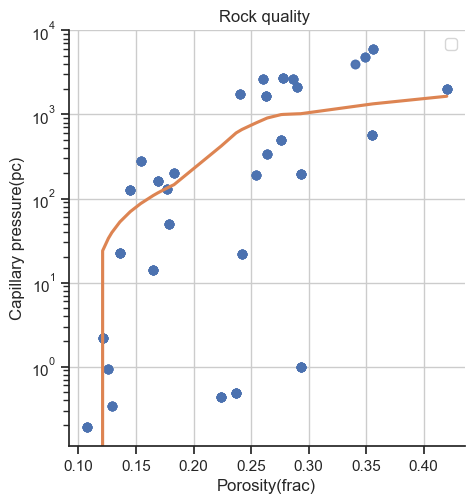

In [25]:
plt.figure(figsize=(10,6))
#ranking=["g1", "g2", "g3", "g4"]
sns.set_theme(style="ticks")
sns.lmplot(a, x="porosity", y="kl" , lowess=True, line_kws={"color": "C1"})
#sns.scatterplot(a, y="kl", x="porosity" ,hue='plug_id', palette="coolwarm" ,markers=True)
plt.xlabel('Porosity(frac)')
plt.ylabel('Capillary pressure(pc)')
plt.title(f'Rock quality ')
#plt.ylim(0.01,10)
#plt.xlim(0.1,1)
plt.legend()
plt.grid()
plt.savefig('pccurveimplot.png')
plt.yscale('log')
#plt.xscale('log')
plt.show()

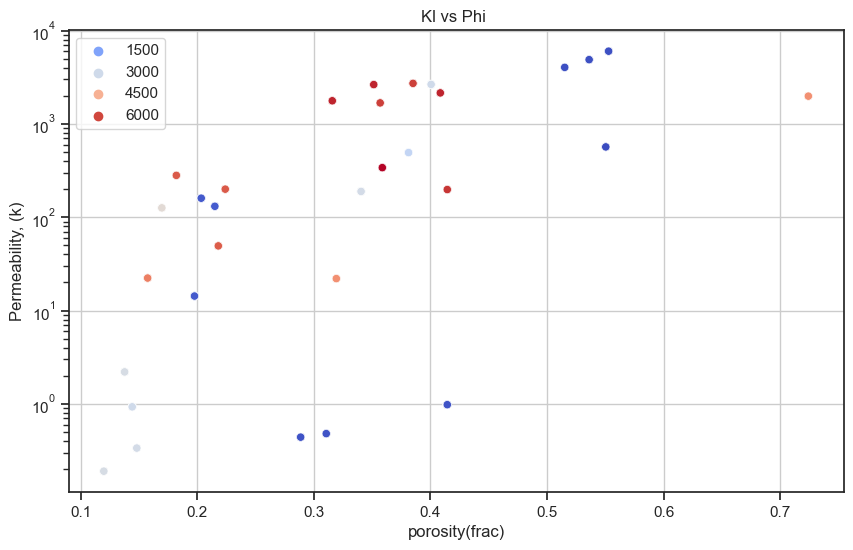

In [26]:
plt.figure(figsize=(10,6))
#ranking=["g1", "g2", "g3", "g4"]
sns.set_theme(style="ticks")
#sns.lmplot(a, x="Norm_porosity", y="RQI" , lowess=True, line_kws={"color": "C1"})
sns.scatterplot(a, x="Norm_porosity", y="kl" , hue='plug_id',palette="coolwarm" ,markers=True)
plt.xlabel('porosity(frac)')
plt.ylabel('Permeability, (k)')
plt.title(f'Kl vs Phi ')
#plt.ylim(0.01,10)

#plt.xlim(0.1,1)
plt.legend()
plt.grid()
plt.savefig('poroperm.png')
plt.yscale('log')
#plt.xscale('log')
plt.savefig('kl vs phi1.png')
plt.show()


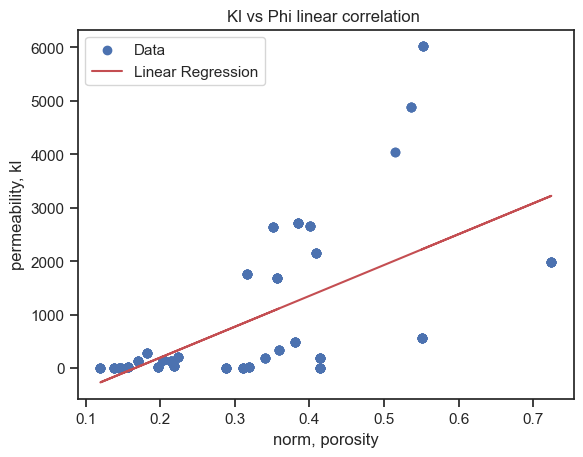

Slope (Coefficient): 5774.15610084435
Intercept: -957.4463899670836
R-squared (Coefficient of Determination): 0.3581485579252133



In [27]:

mdel=a[['kl','porosity','swirr','RQI', 'Norm_porosity']]
mdel
X_data = mdel['Norm_porosity'] 
Y_data = mdel['kl']  
X = X_data.values.reshape(-1, 1) 
Y = Y_data
model = LinearRegression().fit(X, Y)
slope = model.coef_[0]
intercept = model.intercept_
predicted_Y = model.predict(X)
plt.scatter(X, Y, label='Data', color='b')
plt.plot(X, predicted_Y, label='Linear Regression', color='r')
plt.xlabel('norm, porosity')
plt.ylabel('permeability, kl')
plt.title(f'Kl vs Phi linear correlation ')
plt.legend()
plt.savefig('kl vs phi correlation.png')
plt.show()
print("Slope (Coefficient):", slope)
print("Intercept:", intercept)
print("R-squared (Coefficient of Determination):", model.score(X, Y))
print('')


In [31]:

import statsmodels.api as sm
mdel
x=mdel['Norm_porosity']
y=mdel['kl']
x=sm.add_constant(x)
x.head
model=sm.OLS(y,x, missing='drop')
model_result=model.fit()
model_result.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                     kl   R-squared:                       0.358
Model:                            OLS   Adj. R-squared:                  0.355
Method:                 Least Squares   F-statistic:                     130.6
Date:                Fri, 12 Jan 2024   Prob (F-statistic):           2.55e-24
Time:                        06:35:31   Log-Likelihood:                -1988.2
No. Observations:                 236   AIC:                             3980.
Df Residuals:                     234   BIC:                             3987.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const          -957.4464    174.597     -5.484      0.000   -1301.430    -613.463
Norm_porosity  5774.1561    505.320     11.427      0.000    4778.599    6769.714
==============================================================================
Omnibus:                       53.917   Durbin-Watson:                   0.258
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               97.395
Skew:                           1.187   Prob(JB):                     7.09e-22
Kurtosis:                       5.066   Cond. No.                         7.72
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [33]:
a

,sw,pc,plug_id,field_name,surface_tension,cos_contact_angle,porosity,kl,a,c,...,pc-opt,loss_value,swirr,R-squared,scaled_sw,RQI,J_function,Norm_porosity,FZI,Radius
0,1.000000,0.00,142,Siri,30.0,1.0,0.355,567.0,3.945148,0.001048,...,[2.20124925e+03 1.42909539e+02 2.88639040e+01 ...,0.647465,0.199003,0.966911,1.000000,1.254894,0.000000,0.550388,2.280018,inf
1,0.989560,0.05,142,Siri,30.0,1.0,0.355,567.0,3.945148,0.001048,...,[2.20124925e+03 1.42909539e+02 2.88639040e+01 ...,0.647465,0.199003,0.966911,0.986967,1.254894,0.066608,0.550388,2.280018,1200.0
2,0.984615,0.10,142,Siri,30.0,1.0,0.355,567.0,3.945148,0.001048,...,[2.20124925e+03 1.42909539e+02 2.88639040e+01 ...,0.647465,0.199003,0.966911,0.980793,1.254894,0.133216,0.550388,2.280018,600.0
3,0.619780,0.20,142,Siri,30.0,1.0,0.355,567.0,3.945148,0.001048,...,[2.20124925e+03 1.42909539e+02 2.88639040e+01 ...,0.647465,0.199003,0.966911,0.525317,1.254894,0.266432,0.550388,2.280018,300.0
4,0.425824,0.40,142,Siri,30.0,1.0,0.355,567.0,3.945148,0.001048,...,[2.20124925e+03 1.42909539e+02 2.88639040e+01 ...,0.647465,0.199003,0.966911,0.283173,1.254894,0.532864,0.550388,2.280018,150.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
231,0.910000,0.05,6504,Volve,30.0,1.0,0.264,340.0,1.163334,0.016572,...,[1.39250319 0.62172427 0.38792243 0.2775872 0...,0.005029,0.097900,0.903766,0.900233,1.126853,0.059812,0.358696,3.141529,1200.0
232,0.520000,0.10,6504,Volve,30.0,1.0,0.264,340.0,1.163334,0.016572,...,[1.39250319 0.62172427 0.38792243 0.2775872 0...,0.005029,0.097900,0.903766,0.467908,1.126853,0.119623,0.358696,3.141529,600.0
233,0.170000,0.30,6504,Volve,30.0,1.0,0.264,340.0,1.163334,0.016572,...,[1.39250319 0.62172427 0.38792243 0.2775872 0...,0.005029,0.097900,0.903766,0.079925,1.126853,0.358870,0.358696,3.141529,200.0
234,0.130000,0.80,6504,Volve,30.0,1.0,0.264,340.0,1.163334,0.016572,...,[1.39250319 0.62172427 0.38792243 0.2775872 0...,0.005029,0.097900,0.903766,0.035584,1.126853,0.956987,0.358696,3.141529,75.0


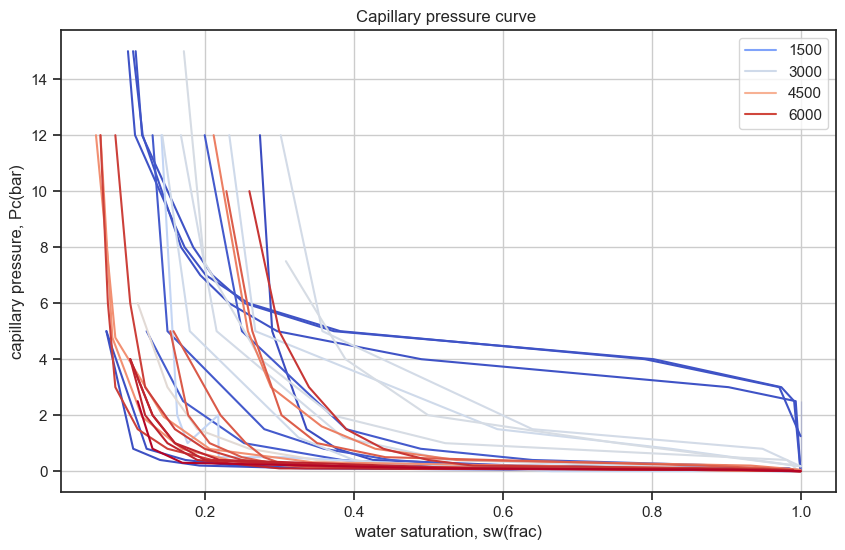

In [34]:
plt.figure(figsize=(10,6))
#ranking=["g1", "g2", "g3", "g4"]
sns.set_theme(style="ticks")
sns.lineplot(a, x="sw", y="pc" ,hue="plug_id", palette="coolwarm" ,markers=True)
#sns.scatterplot(a, x="sw", y="pc", hue="plug_id" , palette="coolwarm" ,markers=True)
plt.xlabel('water saturation, sw(frac)')
plt.ylabel('capillary pressure, Pc(bar)')
plt.title(f'Capillary pressure curve ')
plt.legend()
plt.grid()
plt.savefig('pc curve.png')
#plt.yscale('log')
plt.show()

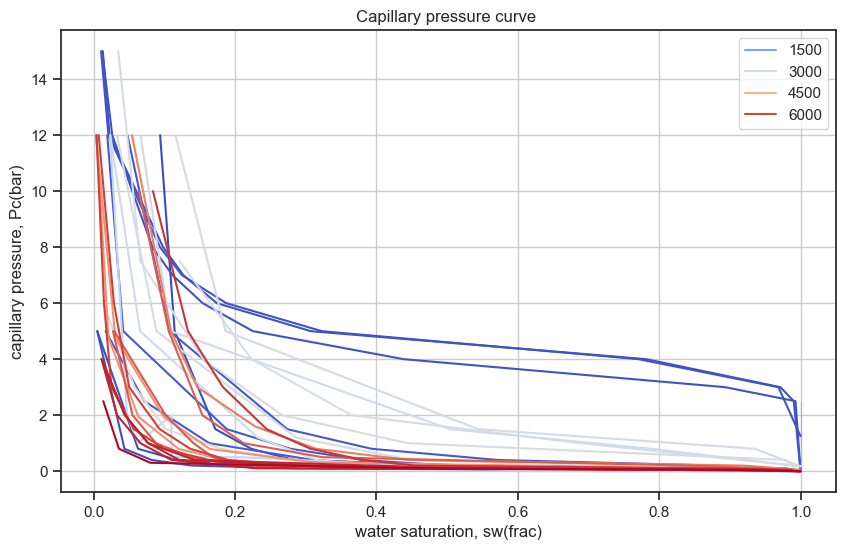

In [35]:
plt.figure(figsize=(10,6))
#ranking=["g1", "g2", "g3", "g4"]
sns.set_theme(style="ticks")
#sns.lineplot(a, x="scaled_sw", y="pc" , palette="coolwarm" ,markers=True)
sns.lineplot(a, x="scaled_sw", y="pc", hue="plug_id" , palette="coolwarm" ,markers=True)
#sns.scatterplot(a, x="scaled_sw", y="pc", hue="plug_id" , palette="coolwarm" ,markers=True)
plt.xlabel('water saturation, sw(frac)')
plt.ylabel('capillary pressure, Pc(bar)')
plt.title(f'Capillary pressure curve ')
#plt.ylim(0,12)
plt.legend()
plt.grid()
plt.savefig('pc curve.png')
#plt.yscale('symlog')
plt.show()

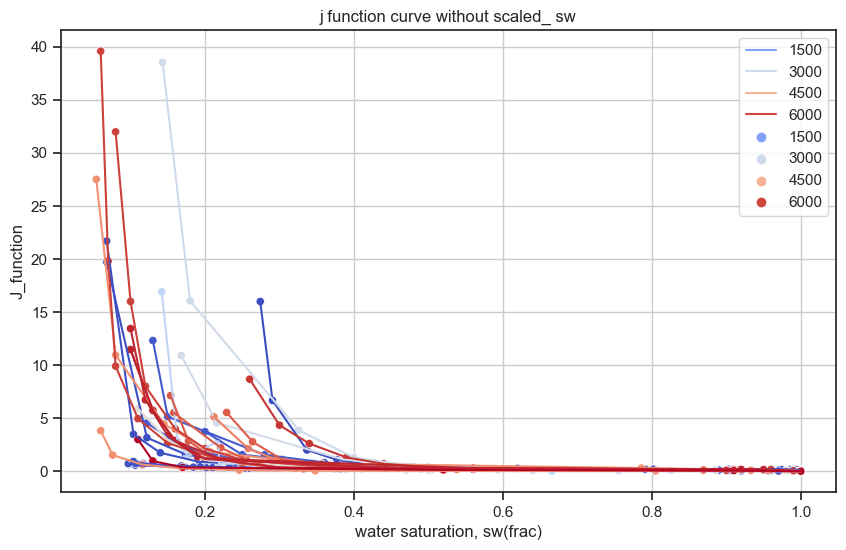

In [36]:
plt.figure(figsize=(10,6))
#ranking=["g1", "g2", "g3", "g4"]
sns.set_theme(style="ticks")
sns.lineplot(a, x="sw", y="J_function", hue="plug_id" , palette="coolwarm" ,markers=True)
sns.scatterplot(a, x="sw", y="J_function", hue="plug_id" , palette="coolwarm" ,markers=True)

plt.xlabel('water saturation, sw(frac)')
plt.ylabel('J_function')
#plt.ylim(0,2)
plt.title(f'j function curve without scaled_ sw')
plt.legend()
plt.grid()
plt.savefig('pc curve.png')
#plt.yscale('log')
plt.show()

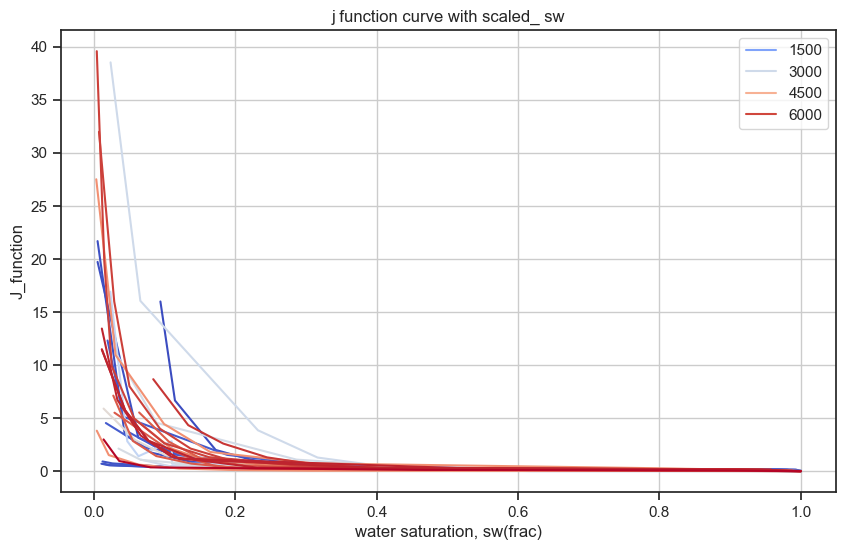

In [37]:
plt.figure(figsize=(10,6))
#ranking=["g1", "g2", "g3", "g4"]
sns.set_theme(style="ticks")
sns.lineplot(a, x="scaled_sw", y="J_function", hue="plug_id" , palette="coolwarm" ,markers=True)
#sns.scatterplot(a, x="scaled_sw", y="J_function", hue="plug_id" , palette="coolwarm" ,markers=True)
plt.xlabel('water saturation, sw(frac)')
plt.ylabel('J_function')
#plt.ylim(0,24)
#plt.xlim(0,0.5)
plt.title(f'j function curve with scaled_ sw')
plt.legend()
plt.grid()
plt.savefig('Jfunction curve.png')

#plt.xscale('log')
plt.show()
#my note: levrett j functtion is used for averaging or correlating cappilkary pressure data (empirical formular)  

C:\Users\oluma\AppData\Local\Temp\ipykernel_30824\118889476.py:5: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


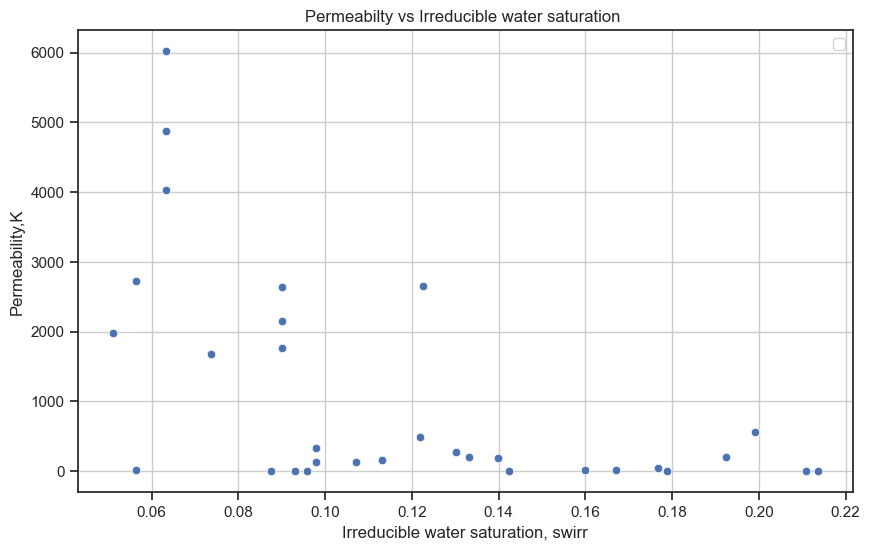

In [110]:
plt.figure(figsize=(10,6))
#ranking=["g1", "g2", "g3", "g4"]
sns.set_theme(style="ticks")
#sns.scatterplot(a, x="a", y="RQI", hue="plug_id" , palette="coolwarm" ,markers=True)
sns.scatterplot(dc_merge, x="swirr", y="kl" ,palette="coolwarm" ,markers=True)
plt.xlabel('Irreducible water saturation, swirr')
plt.ylabel('Permeability,K')
#plt.ylim(0.01,4)
plt.title(f'Permeabilty vs Irreducible water saturation ')
plt.legend()
plt.grid()
plt.savefig('answirrvskl.png')
#plt.yscale('log')
plt.show()

<Figure size 1200x1000 with 0 Axes>

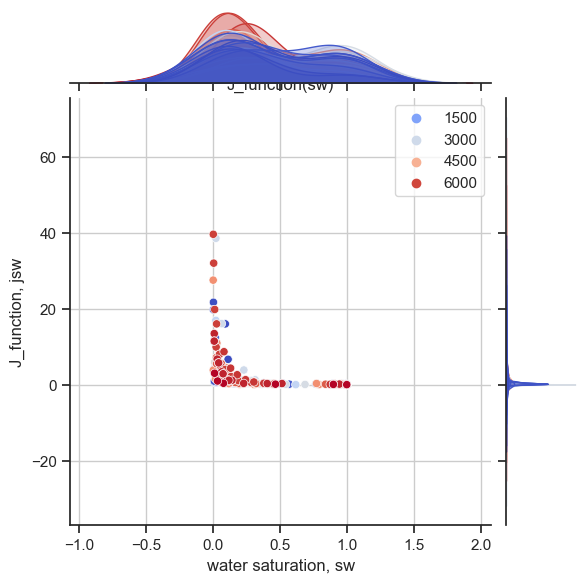

In [39]:

plt.figure(figsize=(12,10))
#sns.scatterplot(data=dp_data, x="porosity",y="kl", hue="plug_id", palette="coolwarm")
sns.jointplot(a, x="scaled_sw", y="J_function", hue="plug_id" , palette="coolwarm" ,markers=True)
#sns.scatterplot(a, x="sw", y="j_function", hue="plug_id" , palette="coolwarm" ,markers=True)

plt.title(f'J_function(sw)')
plt.xlabel('water saturation, sw')
plt.ylabel('J_function, jsw')
plt.legend()
plt.grid()
plt.savefig('j fun.png')
#plt.yscale('log')
plt.show()

<Figure size 1000x600 with 0 Axes>

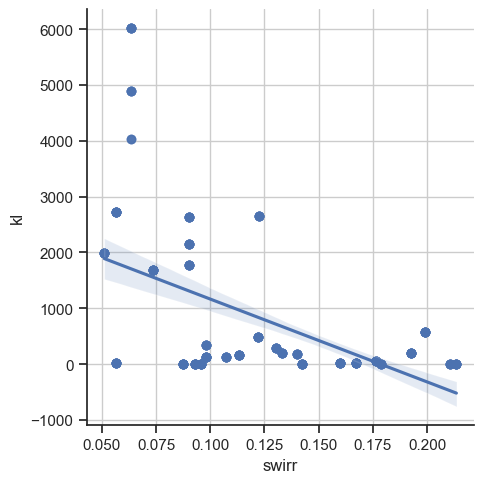

In [111]:
plt.figure(figsize=(10,6))
sns.lmplot(data=a, x="swirr",y="kl", palette="coolwarm")
#sns.scatterplot(data=a, x="swirr",y="kl")
plt.grid()
#plt.yscale('log')
plt.savefig('aaklregessionswirr.png')
plt.show()

array([[<Axes: title={'center': 'kl'}>]], dtype=object)

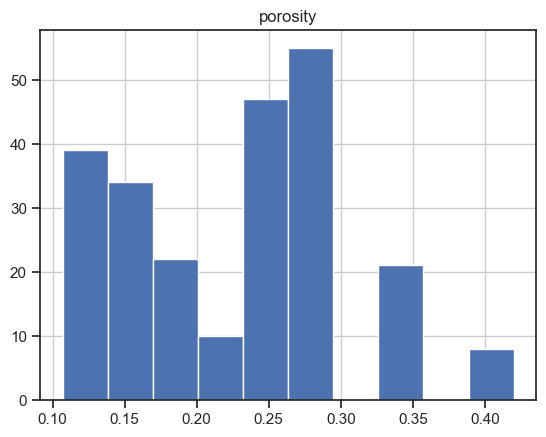

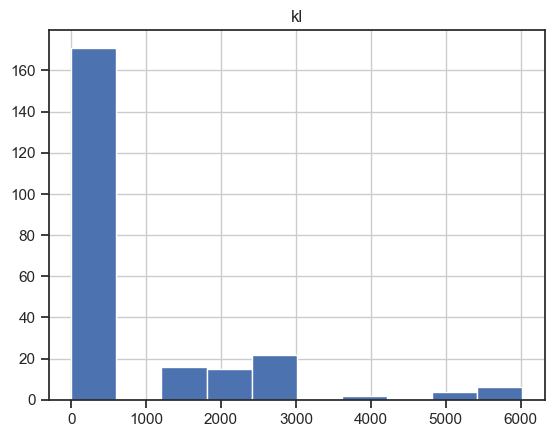

In [41]:
check=a[['porosity','kl']]
a.hist('porosity')
a.hist('kl')

C:\Users\oluma\AppData\Local\Temp\ipykernel_30824\442139617.py:3: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


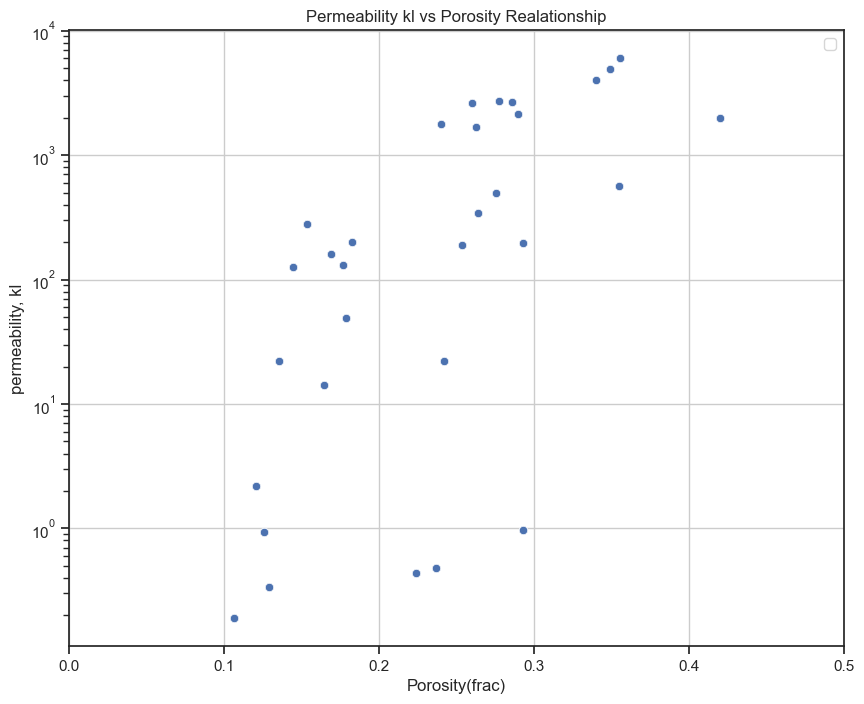

In [92]:
plt.figure(figsize=(10,8))
#sns.scatterplot(data=dz_col, x="swirr_y",y="kl_x", hue="plug_id", palette="coolwarm")
sns.scatterplot(check, x="porosity",y="kl", palette="coolwarm")
plt.ylabel('permeability, kl')
plt.xlabel('Porosity(frac)')
plt.title(f'Permeability kl vs Porosity Realationship')
plt.xlim(0,0.5)
plt.legend()
plt.grid()
plt.savefig('swirr vs Kl.png')
plt.yscale('log')
plt.savefig('aporopermerelation.png')
plt.show()

In [93]:
check

,porosity,kl
0,0.355,567.0
1,0.355,567.0
2,0.355,567.0
3,0.355,567.0
4,0.355,567.0
...,...,...
231,0.264,340.0
232,0.264,340.0
233,0.264,340.0
234,0.264,340.0


<Axes: >

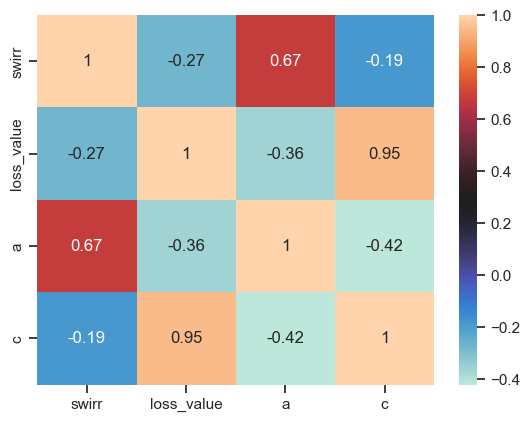

In [44]:
dc_capls=pd.read_csv('curve_capls_no_lse.csv')
for_cross=dc_capls[['swirr', 'loss_value', 'a','c']]
for_cross.corr()
sns.heatmap(for_cross.corr(),annot=True, cmap= "icefire")

In [45]:
dz = a.drop_duplicates(subset='plug_id', keep='first')
a
#dz

,sw,pc,plug_id,field_name,surface_tension,cos_contact_angle,porosity,kl,a,c,...,pc-opt,loss_value,swirr,R-squared,scaled_sw,RQI,J_function,Norm_porosity,FZI,Radius
0,1.000000,0.00,142,Siri,30.0,1.0,0.355,567.0,3.945148,0.001048,...,[2.20124925e+03 1.42909539e+02 2.88639040e+01 ...,0.647465,0.199003,0.966911,1.000000,1.254894,0.000000,0.550388,2.280018,inf
1,0.989560,0.05,142,Siri,30.0,1.0,0.355,567.0,3.945148,0.001048,...,[2.20124925e+03 1.42909539e+02 2.88639040e+01 ...,0.647465,0.199003,0.966911,0.986967,1.254894,0.066608,0.550388,2.280018,1200.0
2,0.984615,0.10,142,Siri,30.0,1.0,0.355,567.0,3.945148,0.001048,...,[2.20124925e+03 1.42909539e+02 2.88639040e+01 ...,0.647465,0.199003,0.966911,0.980793,1.254894,0.133216,0.550388,2.280018,600.0
3,0.619780,0.20,142,Siri,30.0,1.0,0.355,567.0,3.945148,0.001048,...,[2.20124925e+03 1.42909539e+02 2.88639040e+01 ...,0.647465,0.199003,0.966911,0.525317,1.254894,0.266432,0.550388,2.280018,300.0
4,0.425824,0.40,142,Siri,30.0,1.0,0.355,567.0,3.945148,0.001048,...,[2.20124925e+03 1.42909539e+02 2.88639040e+01 ...,0.647465,0.199003,0.966911,0.283173,1.254894,0.532864,0.550388,2.280018,150.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
231,0.910000,0.05,6504,Volve,30.0,1.0,0.264,340.0,1.163334,0.016572,...,[1.39250319 0.62172427 0.38792243 0.2775872 0...,0.005029,0.097900,0.903766,0.900233,1.126853,0.059812,0.358696,3.141529,1200.0
232,0.520000,0.10,6504,Volve,30.0,1.0,0.264,340.0,1.163334,0.016572,...,[1.39250319 0.62172427 0.38792243 0.2775872 0...,0.005029,0.097900,0.903766,0.467908,1.126853,0.119623,0.358696,3.141529,600.0
233,0.170000,0.30,6504,Volve,30.0,1.0,0.264,340.0,1.163334,0.016572,...,[1.39250319 0.62172427 0.38792243 0.2775872 0...,0.005029,0.097900,0.903766,0.079925,1.126853,0.358870,0.358696,3.141529,200.0
234,0.130000,0.80,6504,Volve,30.0,1.0,0.264,340.0,1.163334,0.016572,...,[1.39250319 0.62172427 0.38792243 0.2775872 0...,0.005029,0.097900,0.903766,0.035584,1.126853,0.956987,0.358696,3.141529,75.0


In [1]:
dz.columns
dz_col=dz[['plug_id','field_name','surface_tension', 'cos_contact_angle','porosity','kl', 'a','c','min_sw','swirr', 'loss_value']]
dz_col


NameError: name 'dz' is not defined

In [47]:
dz_col.head()
dz_col.rename(columns = {"contact_angle":"cos_contact_angle"})
dz.describe()

C:\Users\oluma\anaconda3\lib\site-packages\numpy\lib\function_base.py:4527: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)


,sw,pc,plug_id,surface_tension,cos_contact_angle,porosity,kl,a,c,min_sw,loss_value,swirr,R-squared,scaled_sw,RQI,J_function,Norm_porosity,FZI,Radius
count,30.000000,30.000000,30.00000,30.0,30.0,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.0
mean,0.996667,0.005000,3452.80000,30.0,1.0,0.232067,948.381833,1.113691,0.482461,0.147538,2.023624,0.120483,0.947692,0.996375,1.311532,0.011380,0.316838,3.781420,inf
std,0.011547,0.015256,2437.67029,0.0,0.0,0.080547,1466.934835,0.694017,0.828432,0.073960,3.148901,0.048342,0.026869,0.012414,1.219943,0.038468,0.145619,2.913128,NaN
min,0.950000,0.000000,142.00000,30.0,1.0,0.107000,0.190000,0.355994,0.001048,0.054000,0.005029,0.051084,0.902172,0.946028,0.041842,0.000000,0.119821,0.138567,1200.0
25%,1.000000,0.000000,363.00000,30.0,1.0,0.166000,16.225000,0.713057,0.107242,0.100000,0.425047,0.090000,0.926370,1.000000,0.294085,0.000000,0.199046,1.099306,NaN
50%,1.000000,0.000000,3156.00000,30.0,1.0,0.241000,193.500000,1.001125,0.223707,0.126000,0.804943,0.110108,0.950407,1.000000,0.945885,0.000000,0.317525,3.061271,NaN
75%,1.000000,0.000000,5777.75000,30.0,1.0,0.284000,1747.500000,1.353526,0.330765,0.193000,1.641897,0.155604,0.967978,1.000000,2.421875,0.000000,0.396681,6.636154,NaN
max,1.000000,0.050000,6504.00000,30.0,1.0,0.420000,6020.000000,3.945148,3.027707,0.309000,11.931380,0.213519,0.993958,1.000000,4.083221,0.164858,0.724138,9.005406,inf


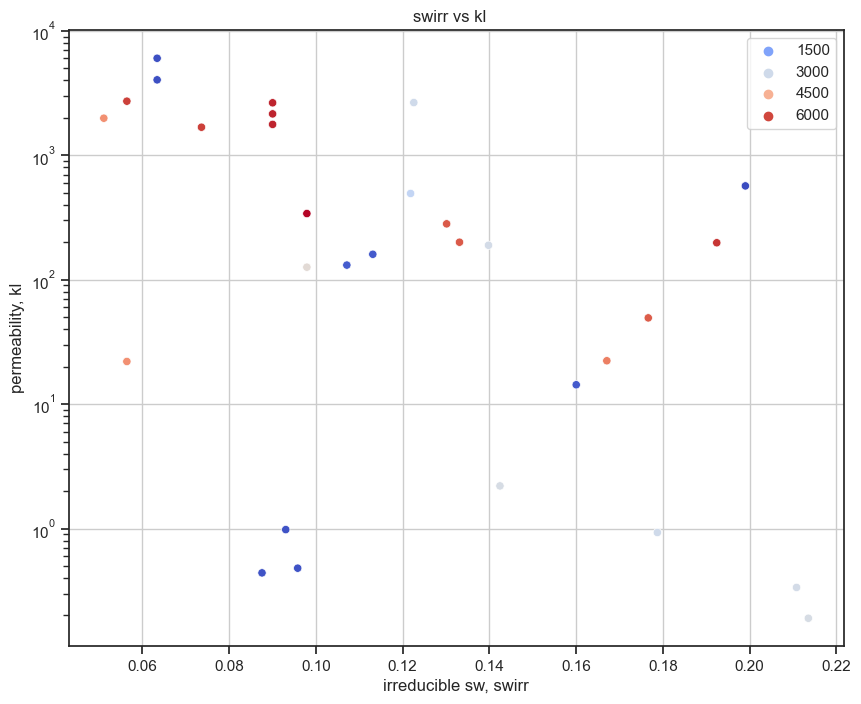

In [89]:

#view column and select priority columns

plt.figure(figsize=(10,8))
#sns.scatterplot(data=dz_col, x="swirr_y",y="kl_x", hue="plug_id", palette="coolwarm")
sns.scatterplot(data=dz_col, y="kl",x="swirr", hue="plug_id", palette="coolwarm")
plt.ylabel('permeability, kl')
plt.xlabel('irreducible sw, swirr')
plt.title(f'swirr vs kl   ')
plt.legend()
plt.grid()
plt.savefig('swirr vs Kl.png')
#plt.yscale('log')
plt.show()

C:\Users\oluma\AppData\Local\Temp\ipykernel_30824\2817957991.py:3: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


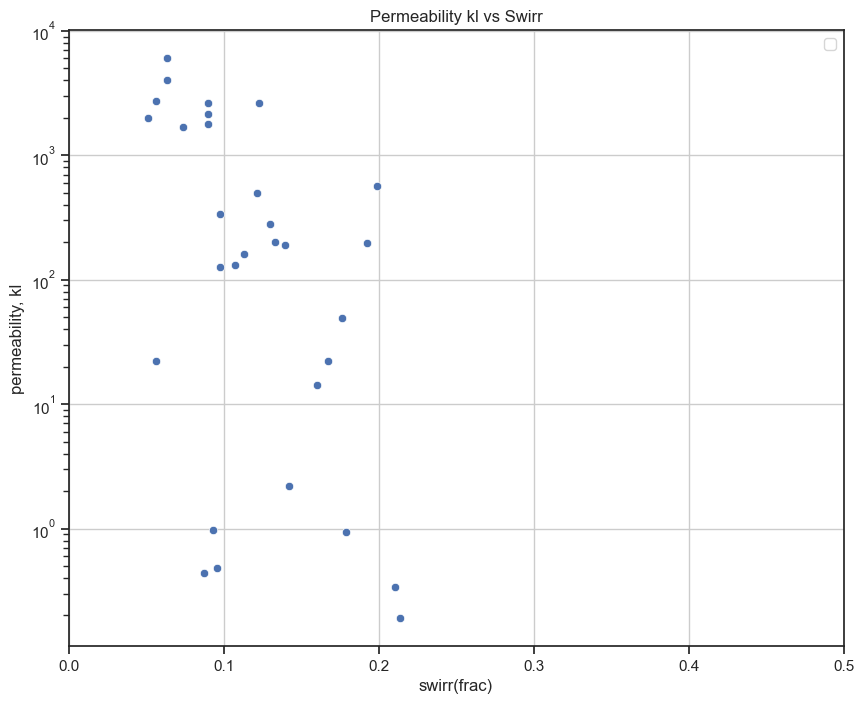

In [94]:
plt.figure(figsize=(10,8))
#sns.scatterplot(data=dz_col, x="swirr_y",y="kl_x", hue="plug_id", palette="coolwarm")
sns.scatterplot(dz_col, x="swirr",y="kl", palette="coolwarm")
plt.ylabel('permeability, kl')
plt.xlabel('swirr(frac)')
plt.title(f'Permeability kl vs Swirr')
plt.xlim(0,0.5)
plt.legend()
plt.grid()
plt.savefig('swirr vs Kl.png')
plt.yscale('log')
plt.savefig('aswirrpermerelation.png')
plt.show()

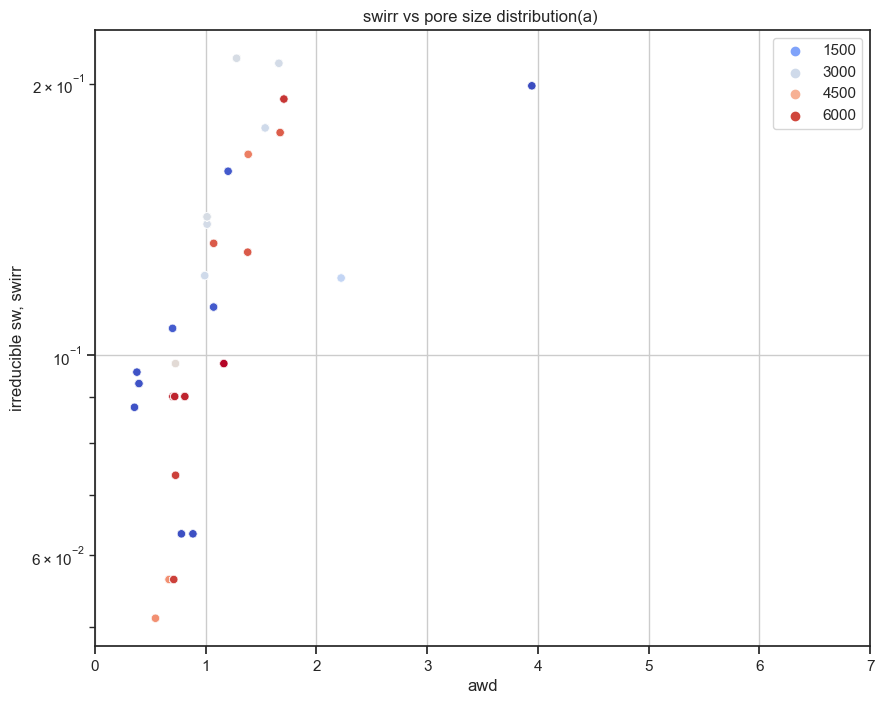

In [87]:
plt.figure(figsize=(10,8))
sns.scatterplot(data=a, x="a",y="swirr", hue="plug_id", palette="coolwarm")
plt.xlabel('awd')
plt.ylabel('irreducible sw, swirr')
plt.title(f'swirr vs pore size distribution(a) ')
plt.legend()
plt.xlim(0,7)
plt.grid()
plt.savefig('swirr vs a.png')
plt.yscale('log')
plt.show()

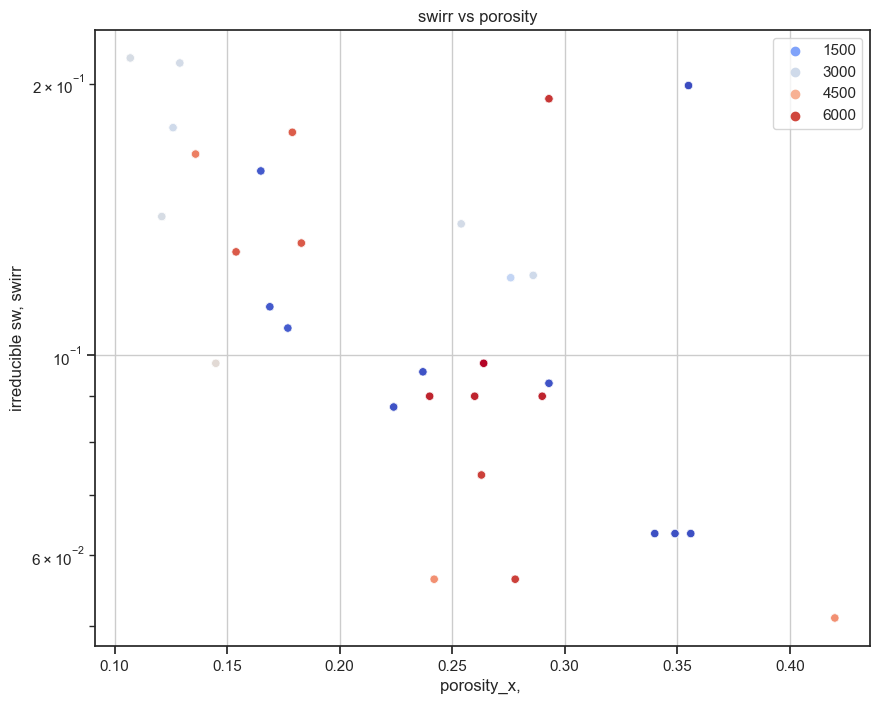

In [50]:
plt.figure(figsize=(10,8))
sns.scatterplot(data=a, x="porosity",y="swirr", hue="plug_id", palette="coolwarm")
plt.xlabel('porosity_x, ')
plt.ylabel('irreducible sw, swirr')
plt.title(f'swirr vs porosity  ')
plt.legend()
plt.grid()
plt.savefig('swirr vs poro.png')
plt.yscale('log')
plt.show()

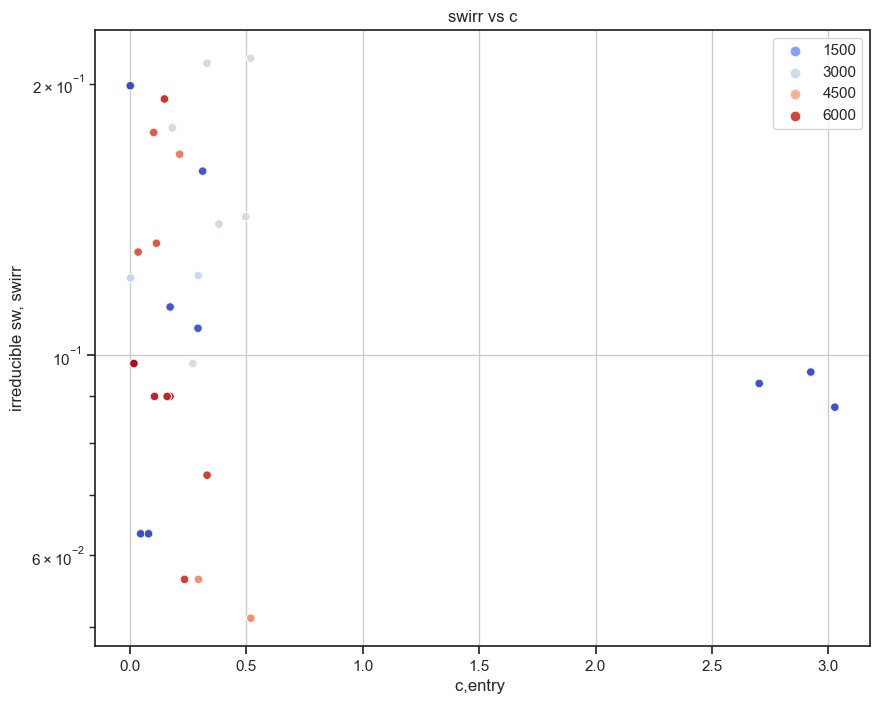

In [52]:
plt.figure(figsize=(10,8))
sns.scatterplot(data=dc_merge, x="c",y="swirr", hue="plug_id", palette="coolwarm")
plt.xlabel('c,entry ')
plt.ylabel('irreducible sw, swirr')
plt.title(f'swirr vs c')
plt.legend()
plt.grid()
plt.savefig('c vs swirr.png')
plt.yscale('log')
plt.show()






# PCA and Kmeans for Dimensionality reduction and clustering


# PCA

In [53]:
import sklearn
print(sklearn.__version__)

1.2.1


In [54]:
from numpy import unique
import numpy as np
from numpy import where
from sklearn.cluster import KMeans
import seaborn as sns
%matplotlib inline
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from scipy.stats import zscore
from factor_analyzer.factor_analyzer import calculate_bartlett_sphericity
from factor_analyzer.factor_analyzer import calculate_kmo

In [55]:
b=a[['kl','porosity','c','a','swirr']]
len(b.columns)

5

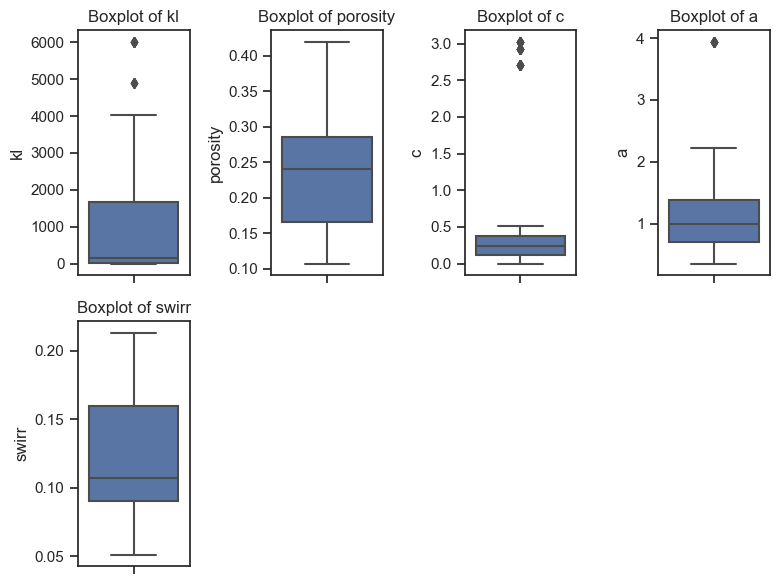

In [56]:
#check for outliers
plt.figure(figsize=(8,6))
for i, j in enumerate(b.columns):
    plt.subplot(2,4,i+1)
    sns.boxplot(y=j, data=b)
    plt.title("Boxplot of "+j)
    plt.tight_layout()
    plt.savefig('outlier.png')
    

In [57]:
#PCA is supposed to be used on data which are correlated and formular for correlation uses average
''''''''''
def remove_outliers(col):
    Q1,Q3=col.quantile([0.2,0.75])
    IQR=Q3-Q1
    lower_range=Q1-(1.5*IQR)
    upper_range=Q3-(1.5*IQR)
    return lower_range,upper_range
for i in b:
    LL,UL=remove_outliers(b[i])
    b[i]=np.where(b[i]> UL,UL, b[i])
    b[i]=np.where(b[i]> LL,LL, b[i])
    
#check for outliers

plt.figure(figsize=(8,6))
new_b=b.columns
for i in range(len(new_b)):
    plt.subplot(2,4,i+1)
    sns.boxplot(y=b[new_b[i]], data=b)
    plt.title('Boxplot of {} '.format(new_b[i]))
    plt.tight_layout()

SyntaxError: incomplete input (3199971232.py, line 2)

In [58]:




b.describe().T


,count,mean,std,min,25%,50%,75%,max
kl,236.0,859.589025,1379.544743,0.190000,11.275000,160.000000,1680.000000,6020.000000
porosity,236.0,0.230877,0.079009,0.107000,0.165000,0.240000,0.286000,0.420000
c,236.0,0.559139,0.901882,0.001048,0.113315,0.234137,0.381945,3.027707
a,236.0,1.110067,0.720513,0.355994,0.703088,0.990652,1.378652,3.945148
swirr,236.0,0.120526,0.047513,0.051084,0.090000,0.107116,0.160000,0.213519


In [59]:
#Normaization or scale the data
scaled_b=b.apply(zscore)
scaled_b.head()
scaled_b

,kl,porosity,c,a,swirr
0,-0.212542,1.574342,-0.620123,3.943172,1.655192
1,-0.212542,1.574342,-0.620123,3.943172,1.655192
2,-0.212542,1.574342,-0.620123,3.943172,1.655192
3,-0.212542,1.574342,-0.620123,3.943172,1.655192
4,-0.212542,1.574342,-0.620123,3.943172,1.655192
...,...,...,...,...,...
231,-0.377439,0.420122,-0.602873,0.074087,-0.477222
232,-0.377439,0.420122,-0.602873,0.074087,-0.477222
233,-0.377439,0.420122,-0.602873,0.074087,-0.477222
234,-0.377439,0.420122,-0.602873,0.074087,-0.477222


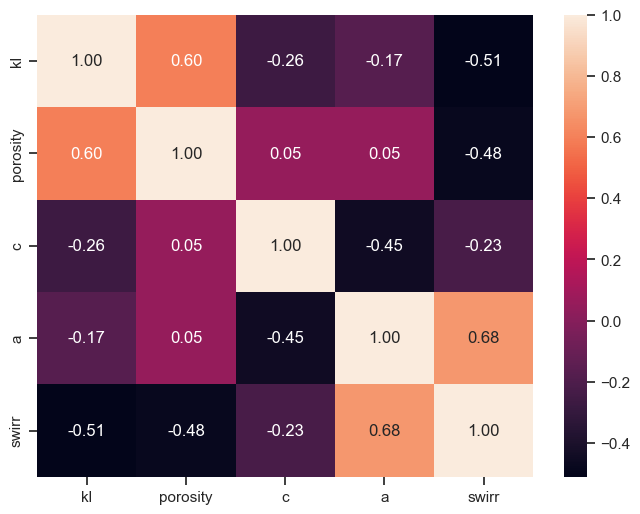

In [60]:
#check for correlation from the standardized data
plt.figure(figsize=(8,6))
sns.heatmap(scaled_b.corr(), annot=True, fmt='.2f')
plt.savefig('correlation of scaled value.png')

In [61]:
chi_square_value,p_value=calculate_bartlett_sphericity(scaled_b)
p_value

3.4493575132234266e-118

In [62]:
kmo_all,kmo_model=calculate_kmo(scaled_b)
kmo_model

0.39911804852014715

In [64]:
pca = PCA(n_components=5)
x_pca = pca.fit_transform(scaled_b)
#scaled_data.shape
#x_pca.shape
print('Shape before PCA: ', scaled_b.shape)
print('Shape after PCA: ', x_pca.shape)
 
pca_df = pd.DataFrame(
    data=pca.components_.T, 
    columns=['PC1', 'PC2', 'PC3', 'PC4','PC5'], index=scaled_b.columns)



print("PCA component shape: {}". format(pca.components_.shape))
print("PCA components:\n{}".format(pca.components_))
print(pca.explained_variance_)
print(pca.explained_variance_ratio_)
pca_df 

Shape before PCA:  (236, 5)
Shape after PCA:  (236, 5)
PCA component shape: (5, 5)
PCA components:
[[ 0.46786675  0.43575264  0.17973888 -0.43161704 -0.6104269 ]
 [ 0.45884193  0.39212853 -0.61350717  0.49978817  0.09757064]
 [-0.20314759  0.61137497  0.61327298  0.42876864  0.15813097]
 [ 0.69625741 -0.2272127   0.38325558 -0.09865276  0.55406028]
 [-0.21100108  0.48057245 -0.26137004 -0.60855862  0.53466884]]
[2.28994512 1.57308048 0.77050463 0.27878758 0.1089588 ]
[0.45604839 0.31328298 0.15344796 0.05552125 0.02169942]


,PC1,PC2,PC3,PC4,PC5
kl,0.467867,0.458842,-0.203148,0.696257,-0.211001
porosity,0.435753,0.392129,0.611375,-0.227213,0.480572
c,0.179739,-0.613507,0.613273,0.383256,-0.261370
a,-0.431617,0.499788,0.428769,-0.098653,-0.608559
swirr,-0.610427,0.097571,0.158131,0.554060,0.534669


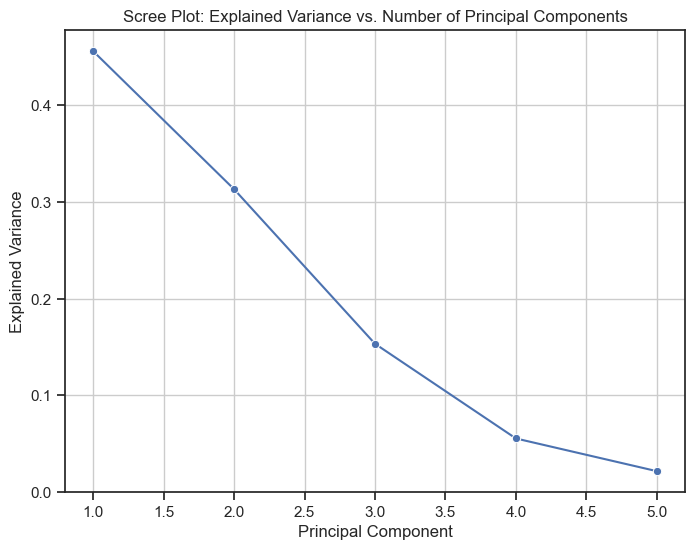

In [65]:
plt.figure(figsize=(8,6))
sns.lineplot(y=pca.explained_variance_ratio_, x=range(1,6), marker='o')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance')
plt.title('Scree Plot: Explained Variance vs. Number of Principal Components')
plt.grid()

plt.savefig('considerlaterscreplot.png')
plt.show()

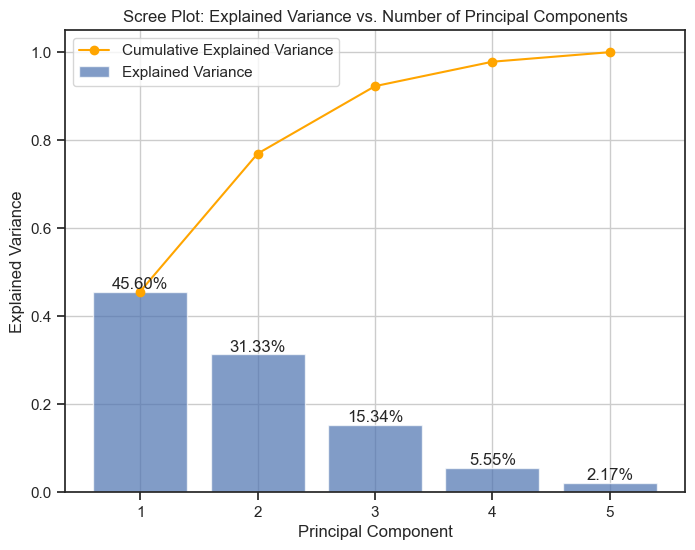

In [66]:

plt.figure(figsize=(8,6))

plt.bar(range(1, len(pca.explained_variance_) + 1), pca.explained_variance_ratio_, label='Explained Variance', alpha=0.7)
plt.plot(range(1, len(pca.explained_variance_) + 1), np.cumsum(pca.explained_variance_ratio_), marker='o', linestyle='-', label='Cumulative Explained Variance', color='orange')

plt.xlabel('Principal Component')
plt.ylabel('Explained Variance')
plt.title('Scree Plot: Explained Variance vs. Number of Principal Components')
plt.legend()
plt.grid()

# Add percentages as text labels to the bars
for i, exp_var in enumerate(pca.explained_variance_ratio_):
    plt.text(i + 1, exp_var, f'{exp_var * 100:.2f}%', ha='center', va='bottom')
plt.savefig('screeplotuse.png')
plt.show()


In [67]:
selected_pca=pca_df[['PC1', 'PC2','PC3']]
selected_pca

,PC1,PC2,PC3
kl,0.467867,0.458842,-0.203148
porosity,0.435753,0.392129,0.611375
c,0.179739,-0.613507,0.613273
a,-0.431617,0.499788,0.428769
swirr,-0.610427,0.097571,0.158131


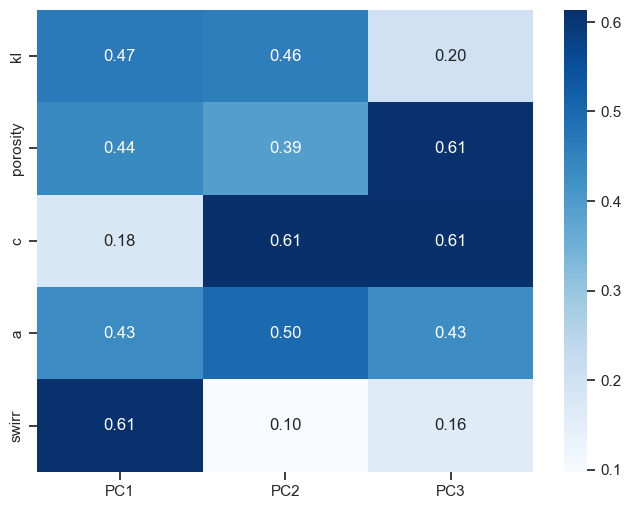

In [68]:
plt.figure(figsize=(8,6))
sns.heatmap(abs(selected_pca), annot=True, cmap='Blues', fmt='.2f')
plt.savefig('apca corroletaion.png')

In [69]:
scaled_b.iloc[0]

kl         -0.212542
porosity    1.574342
c          -0.620123
a           3.943172
swirr       1.655192
Name: 0, dtype: float64

In [70]:
for i in selected_pca.columns:
    pc_score=np.dot(selected_pca[i], scaled_b.iloc[0])
    print(round(pc_score,6),end='')

-2.2371923.032522.577831

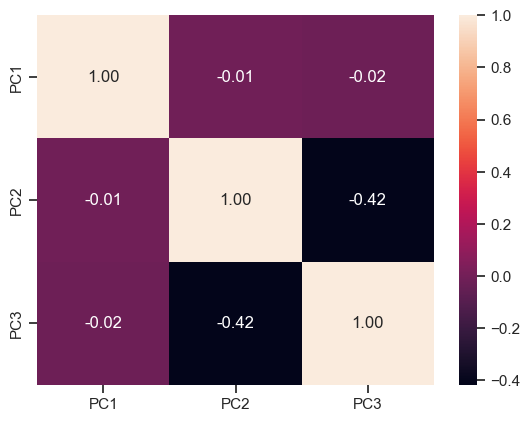

In [71]:
sns.heatmap(selected_pca.corr(), annot=True, fmt='.2f')
plt.savefig('apca corroletaion2eachother.png')

In [72]:

pca = PCA(n_components=3, random_state=123)
new_pca = pca.fit_transform(scaled_b)
#scaled_data.shape
#x_pca.shape
print('Shape before PCA: ', scaled_b.shape)
print('Shape after PCA: ', new_pca.shape)
 
new_pca_df = pd.DataFrame(
    data=new_pca, 
    columns=selected_pca.columns)



print("PCA component shape: {}". format(pca.components_.shape))
print("PCA components:\n{}".format(pca.components_))
print(pca.explained_variance_)
print(pca.explained_variance_ratio_)
new_pca_df 

Shape before PCA:  (236, 5)
Shape after PCA:  (236, 3)
PCA component shape: (3, 5)
PCA components:
[[ 0.46786675  0.43575264  0.17973888 -0.43161704 -0.6104269 ]
 [ 0.45884193  0.39212853 -0.61350717  0.49978817  0.09757064]
 [-0.20314759  0.61137497  0.61327298  0.42876864  0.15813097]]
[2.28994512 1.57308048 0.77050463]
[0.45604839 0.31328298 0.15344796]


,PC1,PC2,PC3
0,-2.237192,3.032520,2.577831
1,-2.237192,3.032520,2.577831
2,-2.237192,3.032520,2.577831
3,-2.237192,3.032520,2.577831
4,-2.237192,3.032520,2.577831
...,...,...,...
231,0.157450,0.351889,-0.079896
232,0.157450,0.351889,-0.079896
233,0.157450,0.351889,-0.079896
234,0.157450,0.351889,-0.079896


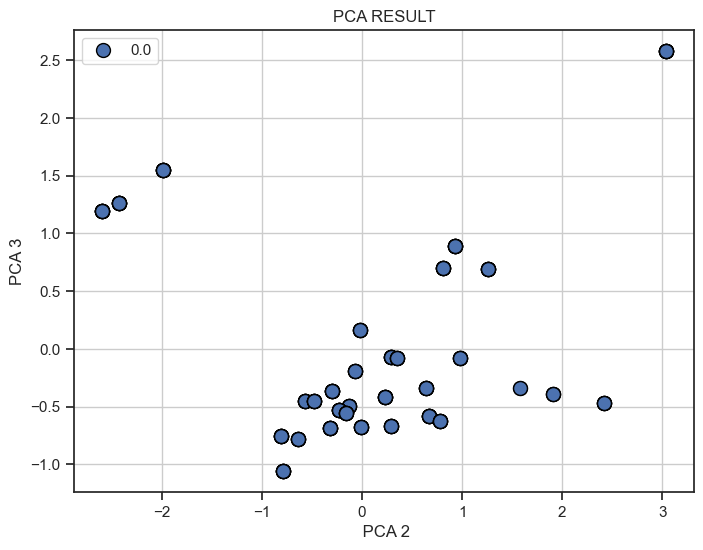

In [73]:
plt.figure(figsize=(8,6))

mglearn.discrete_scatter(new_pca[:,1],new_pca[:,2] )
plt.xlabel(' PCA 2')
plt.ylabel('PCA 3')
plt.title(f'PCA RESULT')
plt.legend()
#plt.xlim(0,7)
plt.grid()
plt.savefig('apca2 and 3.png')
#plt.yscale('log')
plt.show()

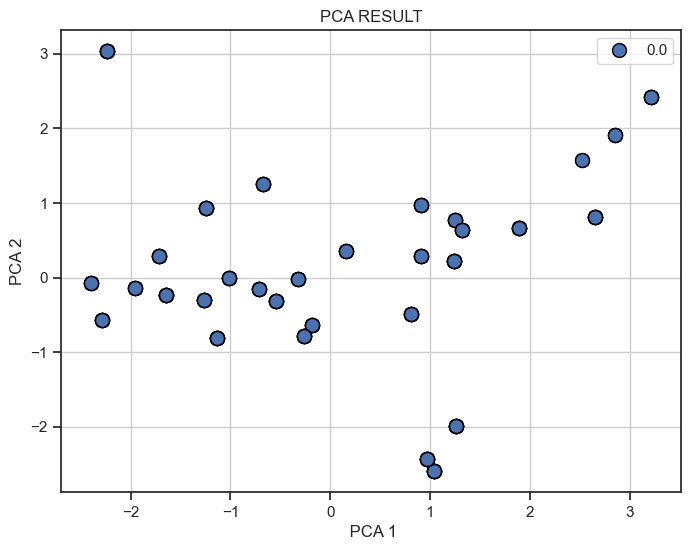

In [74]:
plt.figure(figsize=(8,6))

mglearn.discrete_scatter(new_pca[:,0],new_pca[:,1] )
plt.xlabel(' PCA 1')
plt.ylabel('PCA 2')
plt.title(f'PCA RESULT')
plt.legend()
#plt.xlim(0,7)
plt.grid()
plt.savefig('apcaoneandtwo.png')
#plt.yscale('log')
plt.show()

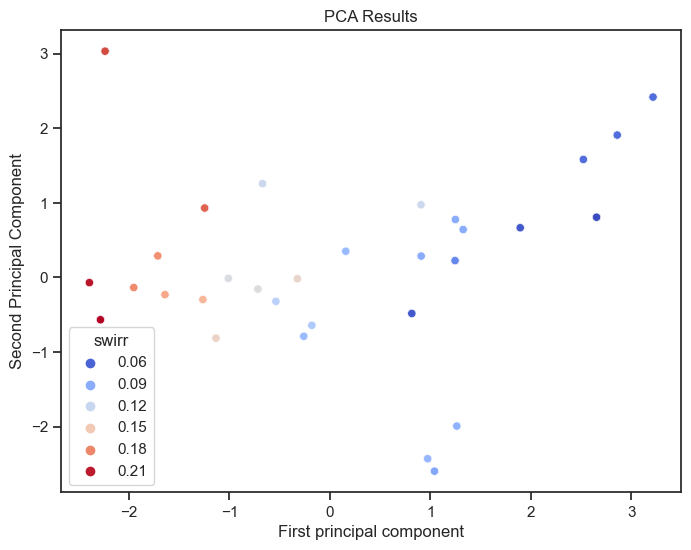

In [75]:

plt.figure(figsize=(8,6))
#mglearn.discrete_scatter(x_pca[:,0],x_pca[:,1],b['a'])
#plt.gca().set_aspect("equal")
#plt.legend(b['swirr'], loc="best")
sns.scatterplot(x=new_pca[:,0],y=new_pca[:,1],hue=b['swirr'] ,data=new_pca_df, palette="coolwarm", )
plt.xlabel('First principal component')
plt.ylabel('Second Principal Component')
plt.title('PCA Results')
plt.show()

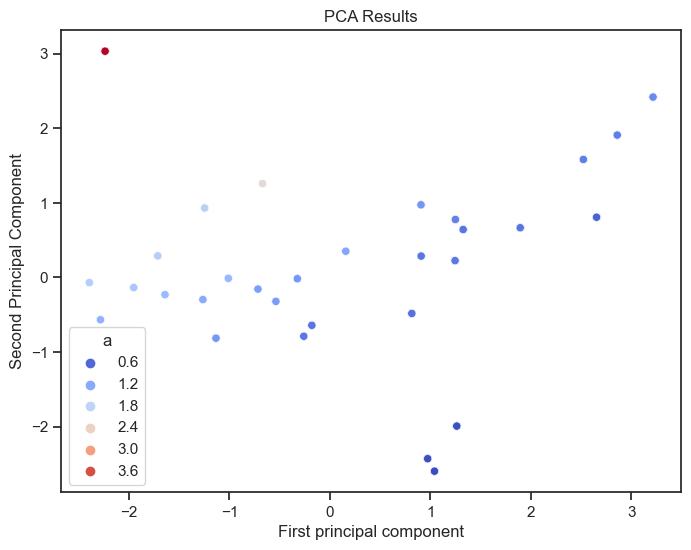

In [76]:
plt.figure(figsize=(8,6))
#mglearn.discrete_scatter(x_pca[:,0],x_pca[:,1],b['a'])
#plt.gca().set_aspect("equal")
#plt.legend(b['swirr'], loc="best")
sns.scatterplot(x=new_pca[:,0],y=new_pca[:,1],hue=b['a'] ,data=new_pca_df, palette="coolwarm", )
plt.xlabel('First principal component')
plt.ylabel('Second Principal Component')
plt.title('PCA Results')
plt.show()

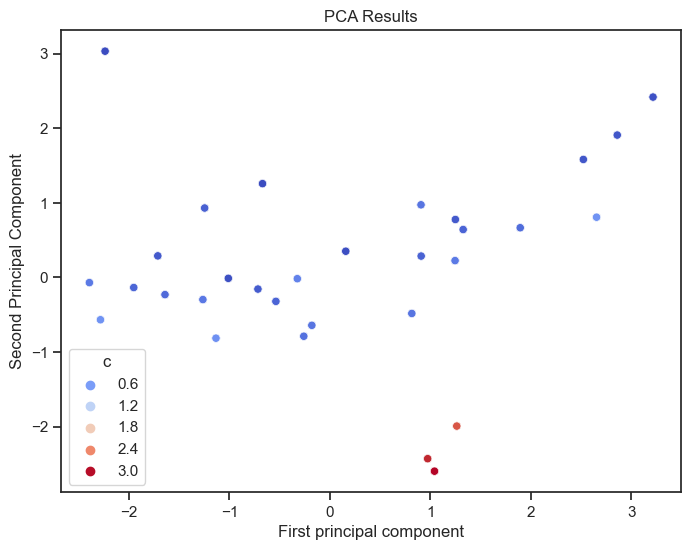

In [77]:
plt.figure(figsize=(8,6))
#mglearn.discrete_scatter(x_pca[:,0],x_pca[:,1],b['a'])
#plt.gca().set_aspect("equal")
#plt.legend(b['swirr'], loc="best")
sns.scatterplot(x=new_pca[:,0],y=new_pca[:,1],hue=b['c'] ,data=new_pca_df, palette="coolwarm", )
plt.xlabel('First principal component')
plt.ylabel('Second Principal Component')
plt.title('PCA Results')
plt.show()

In [78]:
import plotly.express as px
fig=px.line(new_pca_df, x=new_pca[:,0],y=new_pca[:,1], text= b['a'] )

fig.update_traces(textposition="bottom right")
fig.show()

# Kmeans

In [79]:
scaled_b
num_clusters=3
k_means=KMeans(n_clusters=num_clusters, n_init=12)
k_means.fit(scaled_b)
labels=k_means.labels_
print(labels)
labels.shape

C:\Users\oluma\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.



[0 0 0 0 0 0 0 0 0 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 2 2 2 2 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 0 0 0 0 0 0 0 0 0 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 0 0 0 0 0 0]


(236,)

In [80]:
scaled_b

,kl,porosity,c,a,swirr
0,-0.212542,1.574342,-0.620123,3.943172,1.655192
1,-0.212542,1.574342,-0.620123,3.943172,1.655192
2,-0.212542,1.574342,-0.620123,3.943172,1.655192
3,-0.212542,1.574342,-0.620123,3.943172,1.655192
4,-0.212542,1.574342,-0.620123,3.943172,1.655192
...,...,...,...,...,...
231,-0.377439,0.420122,-0.602873,0.074087,-0.477222
232,-0.377439,0.420122,-0.602873,0.074087,-0.477222
233,-0.377439,0.420122,-0.602873,0.074087,-0.477222
234,-0.377439,0.420122,-0.602873,0.074087,-0.477222


In [81]:
b["features"]= labels

C:\Users\oluma\AppData\Local\Temp\ipykernel_30824\987698964.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [82]:
b.sample(10)
#b.groupby('features').mean()

,kl,porosity,c,a,swirr,features
134,22.000,0.242,0.294027,0.668464,0.056400,2
36,0.480,0.237,2.924431,0.378021,0.095784,1
211,2640.000,0.260,0.105217,0.811062,0.090000,2
108,2.200,0.121,0.496845,1.011598,0.142416,0
146,1985.000,0.420,0.518945,0.545698,0.051084,2
89,0.929,0.126,0.181990,1.536365,0.178711,0
93,2651.000,0.286,0.293153,0.990652,0.122551,2
155,22.300,0.136,0.213276,1.383266,0.167056,0
98,0.336,0.129,0.330319,1.660334,0.210796,0
145,1985.000,0.420,0.518945,0.545698,0.051084,2


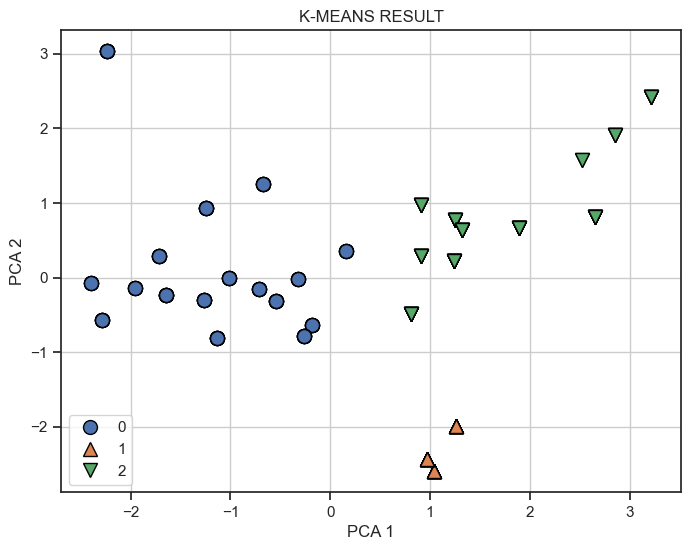

In [115]:
plt.figure(figsize=(8,6))
#sns.scatterplot(data=b, x="sw",y="pc", hue="features", palette="coolwarm")
#sns.lineplot(data=b, x="sw",y="pc", hue="features", palette="coolwarm")
mglearn.discrete_scatter(new_pca[:,0],new_pca[:,1],b['features'])
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.title(f'K-MEANS RESULT')
plt.legend()
#plt.xlim(0,7)
plt.grid()
plt.savefig('aaaKmeans1')
#plt.yscale('log')
plt.show()

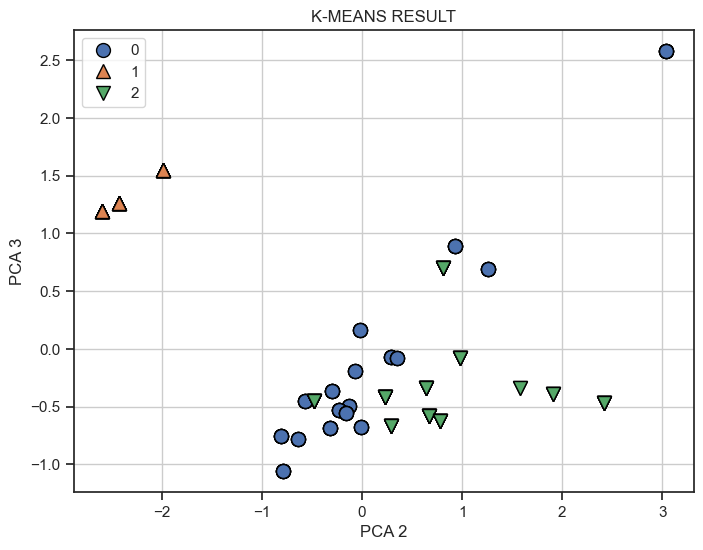

In [116]:
plt.figure(figsize=(8,6))
#sns.scatterplot(data=b, x="sw",y="pc", hue="features", palette="coolwarm")
#sns.lineplot(data=b, x="sw",y="pc", hue="features", palette="coolwarm")
mglearn.discrete_scatter(new_pca[:,1],new_pca[:,2],b['features'])
plt.xlabel('PCA 2')
plt.ylabel('PCA 3')
plt.title(f'K-MEANS RESULT')
plt.legend()
#plt.xlim(0,7)
plt.grid()
plt.savefig('aaaKmeanug2')
#plt.yscale('log')
plt.show()

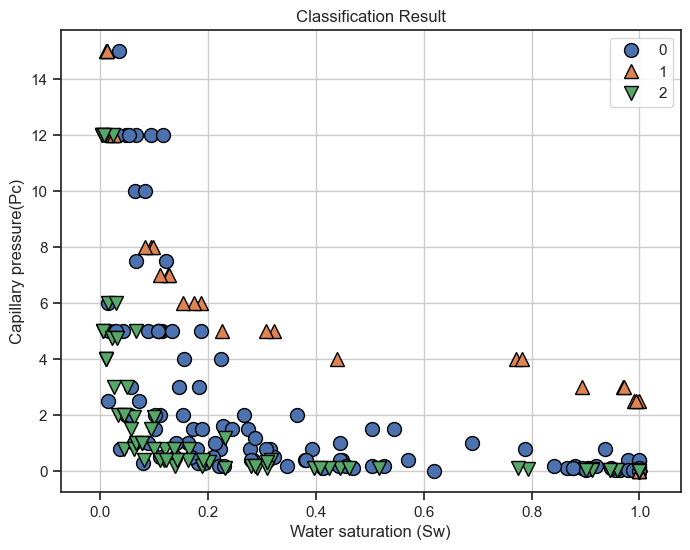

In [120]:
plt.figure(figsize=(8,6))
#sns.scatterplot(data=a, x="sw",y="pc", hue="features", palette="coolwarm")
#sns.lineplot(data=a, x="sw",y="pc", hue="features", palette="coolwarm")
mglearn.discrete_scatter(a['scaled_sw'], a['pc'],b['features'])
plt.xlabel('Water saturation (Sw)')
plt.ylabel('Capillary pressure(Pc)')
plt.title(f'Classification Result')
plt.legend()
#plt.xlim(0,7)
plt.grid()
plt.savefig('aKmeans_result.png')
#plt.yscale('log')
plt.show()